In [186]:
import pandas as pd
import numpy as np
import scipy.stats as sts
import gzip as gz
import pysam
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import scipy
import glob
from joblib import Parallel, delayed
import sys
import argparse
import plotly.express as px
import plotly.io as pio
import os
from Bio.Seq import Seq
from Bio import SeqIO
import swifter
import sys
import plotly.express as px
from Levenshtein import distance
gdf5 = pd.read_csv("gdf5.csv")
def revcomp(seq):
    try: ## python2
        tab = string.maketrans(b"ACTG", b"TGAC")
    except:  ## python3
        tab = bytes.maketrans(b"ACTG", b"TGAC")
    return seq.translate(tab)[::-1]

import re
def read_rhamp_dsODN_bam(gRNA,donor,chr,pos):
    template =f"/home/yli11/dirs/02172023_GUIDEseq2_GV_Novaseq/rhamp_seq_validation/dsODN_bam_files/bam_indel_dsODN_yli11_2023-12-07/{gRNA}_*_D{int(donor)}_*tsv"
    file = glob.glob(template)
    if len(file)==0:
        return pd.DataFrame(columns=[0,1,2,3,'A','C','G','T'])
    file = [i for i in file if "ctrls" not in i ]
    file =file[0]
    try:
        gt = pd.read_csv(file,sep="\t",header=None,usecols=list(range(10)))
    except:
        x=open(file).readlines()
        if x!=[]:
            print (file)
        return pd.DataFrame(columns=[0,1,2,3,'A','C','G','T'])
    gt = gt.drop_duplicates([0,1])
    gt[2] = gt[2].apply(lambda x:x.upper())
    gt['A'] = [int(x.split(":")[1]) for x in gt[5]]
    gt['C'] = [int(x.split(":")[1]) for x in gt[6]]    
    gt['G'] = [int(x.split(":")[1]) for x in gt[7]]    
    gt['T'] = [int(x.split(":")[1]) for x in gt[8]] 
    gt.index = gt[0]+"_"+gt[1].astype(str) 
    gt = gt[gt[0]==chr]
    gt = gt[gt[1]==pos]
    return gt[[0,1,2,3,'A','C','G','T']]
def read_rhamp_control_bam(gRNA,donor,chr,pos):
    template =f"/home/yli11/dirs/02172023_GUIDEseq2_GV_Novaseq/rhamp_seq_validation/bam_files/bam_count_indel_yli11_2023-10-27/{gRNA}_*_ctrls_D{int(donor)}_*tsv"
    file = glob.glob(template)
    # print (file)
    if len(file)==0:
        return pd.DataFrame(columns=[0,1,2,3,'A','C','G','T'])
    # file = [i for i in file if "ctrls" not in i ]
    file =file[0]
    try:
        gt = pd.read_csv(file,sep="\t",header=None,usecols=list(range(10)),engine='python')
    except:
        x=open(file).readlines()
        if x!=[]:
            print (file)
        return pd.DataFrame(columns=[0,1,2,3,'A','C','G','T'])
    gt = gt.drop_duplicates([0,1])
    gt[2] = gt[2].apply(lambda x:x.upper())
    gt['A'] = [int(x.split(":")[1]) for x in gt[5]]
    gt['C'] = [int(x.split(":")[1]) for x in gt[6]]    
    gt['G'] = [int(x.split(":")[1]) for x in gt[7]]    
    gt['T'] = [int(x.split(":")[1]) for x in gt[8]] 
    gt.index = gt[0]+"_"+gt[1].astype(str) 
    gt = gt[gt[0]==chr]
    gt = gt[gt[1]==pos]
    return gt[[0,1,2,3,'A','C','G','T']]
def read_rhamp_indel_bam(gRNA,donor,chr,pos):
    template =f"/home/yli11/dirs/02172023_GUIDEseq2_GV_Novaseq/rhamp_seq_validation/indel_bam_files/bam_indel_dsODN_yli11_2024-07-29/{gRNA}_*_D{int(donor)}_*tsv"
    file = glob.glob(template)
    if len(file)==0:
        return pd.DataFrame(columns=[0,1,2,3,'A','C','G','T'])
    file = [i for i in file if "ctrls" not in i ]
    file =file[0]
    try:
        gt = pd.read_csv(file,sep="\t",header=None,usecols=list(range(10)),engine='python')
    except:
        x=open(file).readlines()
        if x!=[]:
            print (file)
        return pd.DataFrame(columns=[0,1,2,3,'A','C','G','T'])
    gt = gt.drop_duplicates([0,1])
    gt[2] = gt[2].apply(lambda x:x.upper())
    gt['A'] = [int(x.split(":")[1]) for x in gt[5]]
    gt['C'] = [int(x.split(":")[1]) for x in gt[6]]    
    gt['G'] = [int(x.split(":")[1]) for x in gt[7]]    
    gt['T'] = [int(x.split(":")[1]) for x in gt[8]] 
    gt.index = gt[0]+"_"+gt[1].astype(str) 
    gt = gt[gt[0]==chr]
    gt = gt[gt[1]==pos]
    return gt[[0,1,2,3,'A','C','G','T']]
def get_AI_rhamp_dsODN(variant_ID):
    tmp = gdf5[(gdf5.ID==variant_ID)&(gdf5.Genotype!="0|0")&(gdf5.Genotype!="1|1")][['ID','Genotype','donor_x','gRNA_x','value']]                                                                                                              
    dsODN_bam_ref_count_list = []
    dsODN_bam_alt_count_list = []
    indel_bam_ref_count_list = []
    indel_bam_alt_count_list = []
    control_bam_ref_count_list = []
    control_bam_alt_count_list = []
    sample_list = []
    if tmp.shape[0]>0:
        for i,r in tmp.iterrows():
            chr,pos,ref,alt = re.split(":|_",r.ID)
            pos = int(pos)
            chr = "chr"+chr
            gRNA = (r.gRNA_x).split("_")[0]
            donor = str(int(r.donor_x))
            # print (gRNA, donor)
            gt_rhamp_control = read_rhamp_control_bam(gRNA,donor,chr,pos)
            gt_rhamp_indel = read_rhamp_indel_bam(gRNA,donor,chr,pos)
            gt_rhamp_dsODN = read_rhamp_dsODN_bam(gRNA,donor,chr,pos)
            if gt_rhamp_control.shape[0]>0:
                control_bam_ref_count_list+=gt_rhamp_control[ref].tolist()
                control_bam_alt_count_list+=gt_rhamp_control[alt].tolist()
                sample_list.append(donor)
                # in case indelbam and dsODN_bam is empty
                if gt_rhamp_indel.shape[0]>0: 
                    indel_bam_ref_count_list+=gt_rhamp_indel[ref].tolist()
                    indel_bam_alt_count_list+=gt_rhamp_indel[alt].tolist()                    
                else:
                    indel_bam_ref_count_list+=[0]
                    indel_bam_alt_count_list+=[0]
                if gt_rhamp_dsODN.shape[0]>0: 
                    dsODN_bam_ref_count_list+=gt_rhamp_dsODN[ref].tolist()
                    dsODN_bam_alt_count_list+=gt_rhamp_dsODN[alt].tolist()                    
                else:
                    dsODN_bam_ref_count_list+=[0]
                    dsODN_bam_alt_count_list+=[0]                
               
    return dsODN_bam_ref_count_list,dsODN_bam_alt_count_list,indel_bam_ref_count_list,indel_bam_alt_count_list,control_bam_ref_count_list,control_bam_alt_count_list,sample_list
get_AI_rhamp_dsODN("2:86261142:A:G")



([0,
  0,
  0,
  0,
  0,
  0,
  4,
  0,
  7,
  0,
  0,
  0,
  7,
  0,
  0,
  0,
  8,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  6,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  6],
 [0,
  12,
  0,
  21,
  2,
  11,
  3,
  0,
  20,
  0,
  0,
  0,
  9,
  0,
  2,
  7,
  0,
  0,
  3,
  0,
  0,
  0,
  8,
  15,
  40,
  0,
  9,
  0,
  33,
  1,
  3,
  11,
  0,
  19],
 [6,
  14,
  15,
  13,
  24,
  7,
  22,
  13,
  26,
  16,
  10,
  13,
  22,
  7,
  10,
  12,
  25,
  6,
  7,
  8,
  11,
  8,
  13,
  9,
  30,
  17,
  16,
  29,
  14,
  29,
  6,
  27,
  0,
  24],
 [55,
  47,
  31,
  38,
  19,
  22,
  39,
  11,
  77,
  7,
  29,
  19,
  21,
  30,
  42,
  27,
  21,
  23,
  24,
  18,
  6,
  13,
  15,
  28,
  87,
  17,
  17,
  7,
  62,
  29,
  21,
  41,
  0,
  47],
 [11114,
  10310,
  12856,
  10741,
  9220,
  10437,
  9460,
  8819,
  11145,
  11854,
  10556,
  10673,
  10635,
  12236,
  12067,
  11921,
  11259,
  10172,
  10382,
  10312,
  11802,
  9278,
  10074,
  10968,
  11889,
  12953,
  11634,
  11442,
  101

In [181]:
df = pd.read_csv("G1000_donor95_GUIDE_seq_overlap.Variant_info.PLINK_stats.Allelic_Imbalance_summary.csv")
df.head()

,#CHROM,POS,ID,REF,ALT,Variant_mutation_type,MAF_EUR_unrel,MAF_EAS_unrel,MAF_AMR_unrel,MAF_SAS_unrel,...,rhamp_seq_integration_FDR_BH,#HET_donor,GUIDE_seq_mean_VAF_HET,Rhamp_seq_nuclease_mean_VAF_HET,Rhamp_seq_control_mean_VAF_HET,Rhamp_seq_AI_p_value,Rhamp_seq_AI_FDR,#HET_donor_GUIDEseq_has_reads,#HET_donor_total,Rhamp_seq_dsODN_reads_mean_VAF_HET
0,chr4,1310782,4:1310782:C:T,C,T,SNP,0.040756,0.000000,0.021614,0.009202,...,NaN,2.0,1.000000,0.833035,0.880745,1.952667e-02,4.567757e-02,2.0,2.0,1.000000
1,chr14,35389346,14:35389346:T:G,T,G,SNP,0.180915,0.058532,0.370317,0.210634,...,1.003646e-52,42.0,0.977655,0.405946,0.499502,0.000000e+00,0.000000e+00,42.0,42.0,0.977655
2,chr13,102628187,13:102628187:G:A,G,A,SNP,0.136183,0.134921,0.113833,0.139059,...,7.126032e-27,19.0,0.447368,0.497976,0.500587,2.121967e-14,4.042676e-13,19.0,19.0,0.447368
3,chr3,49421943,3:49421943:T:C,T,C,SNP,0.431412,0.088294,0.384726,0.258691,...,4.267828e-13,41.0,0.000000,0.500315,0.495586,2.803942e-09,2.894795e-08,41.0,41.0,0.000000
4,chr1,64133482,1:64133482:A:C,A,C,SNP,0.002982,0.000000,0.025937,0.000000,...,1.121229e-04,8.0,0.001863,0.510738,0.491872,2.414852e-21,6.030604e-20,8.0,8.0,0.001863


In [187]:
out = []
out_index=[]
for i,r in df[df.Variant_mutation_type=="SNP"].iterrows():
    try:
        current_line = []
        current_line+= get_AI_rhamp_dsODN(r.ID2)
        # print (current_line)
        out.append(current_line)
        out_index.append(r.ID2)
    except Exception as e:
        print (e)
        print (r.ID2)
df2 = pd.DataFrame(out)
df2.index=out_index    

In [189]:
df2.columns = ["dsODN_bam_ref","dsODN_bam_alt","indel_bam_ref","indel_bam_alt","control_bam_ref","control_bam_alt","sample_list"]

In [190]:
df2.head()

,dsODN_bam_ref,dsODN_bam_alt,indel_bam_ref,indel_bam_alt,control_bam_ref,control_bam_alt,sample_list
4:1310782:C:T,"[0, 0]","[0, 0]","[0, 0]","[2, 0]","[11, 6]","[104, 36]","[17, 13]"
14:35389346:T:G,"[166, 235, 214, 309, 157, 181, 145, 294, 56, 1...","[2400, 2408, 2554, 2364, 1870, 2307, 2689, 227...","[237, 310, 264, 340, 200, 240, 205, 365, 88, 1...","[4358, 4211, 4409, 5116, 4157, 4505, 4689, 423...","[10414, 9968, 9344, 9122, 8263, 8091, 9673, 96...","[9801, 9929, 9534, 9802, 8049, 8594, 9194, 982...","[66, 65, 64, 63, 62, 51, 59, 58, 56, 54, 53, 5..."
13:102628187:G:A,"[8, 15, 16, 15, 0, 10, 9, 46, 12, 26, 0, 5, 0,...","[49, 62, 88, 22, 17, 106, 33, 60, 36, 16, 0, 6...","[9, 18, 18, 15, 8, 10, 25, 53, 14, 27, 4, 23, ...","[85, 92, 133, 22, 19, 168, 45, 98, 55, 24, 30,...","[18289, 16696, 15287, 16797, 20498, 17496, 183...","[17996, 15126, 15874, 16660, 20317, 17865, 200...","[25, 26, 28, 42, 3, 5, 8, 19, 78, 80, 85, 87, ..."
3:49421943:T:C,"[0, 10, 20, 4, 0, 3, 8, 6, 0, 5, 1, 4, 3, 27, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[15, 24, 38, 24, 11, 20, 24, 13, 9, 32, 7, 9, ...","[8, 5, 5, 0, 11, 8, 5, 3, 4, 5, 11, 5, 3, 2, 1...","[10734, 9924, 9873, 4876, 10543, 10229, 9936, ...","[10328, 9915, 9858, 4470, 10306, 9574, 9844, 1...","[45, 67, 57, 55, 54, 53, 52, 50, 49, 69, 70, 9..."
1:64133482:A:C,"[506, 138, 215, 31, 196, 276, 473, 284]","[0, 0, 8, 0, 0, 0, 0, 7]","[1069, 426, 571, 39, 452, 677, 831, 466]","[5, 1, 9, 3, 4, 2, 3, 9]","[19473, 1139, 4469, 2818, 3429, 20307, 22027, ...","[18639, 1113, 4382, 2505, 3671, 19433, 20770, ...","[57, 95, 93, 92, 85, 83, 80, 78]"


In [199]:
T_ref = 20
T_alt = 4
C_ref = 20000
C_alt = 20000
table = np.array([[T_ref, C_ref], [T_alt, C_alt]])
P = fisher_exact(table, alternative='two-sided')
P.pvalue

0.0015391670366849955

In [191]:
from scipy.stats import fisher_exact


In [200]:
def get_P_value(r):
    N = len(r.sample_list)
    P_dsODN_list = []
    P_indel_list = []
    for i in range(N):
        dsODN_ref = r.dsODN_bam_ref[i]
        dsODN_alt = r.dsODN_bam_alt[i]
        dsODN_total = dsODN_ref+dsODN_alt
        indel_ref = r.indel_bam_ref[i]
        indel_alt = r.indel_bam_alt[i]
        indel_total = indel_ref+indel_alt
        control_ref = r.control_bam_ref[i]
        control_alt = r.control_bam_alt[i]
        control_total = control_ref+control_alt
        table = np.array([[dsODN_ref, dsODN_alt], [control_ref, control_alt]])
        P = fisher_exact(table, alternative='two-sided')  
        P_dsODN_list.append(P.pvalue)
        table = np.array([[indel_ref, indel_alt], [control_ref, control_alt]])
        P = fisher_exact(table, alternative='two-sided')  
        P_indel_list.append(P.pvalue)        
    r['P_dsODN_list'] = P_dsODN_list
    r['P_indel_list'] = P_indel_list
    if len(P_dsODN_list)>0:
        r['P_dsODN'] = min(P_dsODN_list)
    else:
        r['P_dsODN'] = 1
    if len(P_indel_list)>0:
        r['P_indel'] = min(P_indel_list)
    else:
        r['P_indel'] = 1
    return r
df3 = df2.apply(get_P_value,axis=1)

In [288]:
df4.to_csv("rhamp_AI.stats.csv")

In [202]:
from statsmodels.stats import multitest
df3['FDR_dsODN'] = multitest.fdrcorrection(df3['P_dsODN'].tolist())[1].tolist()
df3['FDR_indel'] = multitest.fdrcorrection(df3['P_indel'].tolist())[1].tolist()

In [205]:
df3['Total_dsODN'] = df3.apply(lambda r:sum(r.dsODN_bam_ref)+sum(r.dsODN_bam_alt),axis=1)
df3['Total_indel'] = df3.apply(lambda r:sum(r.indel_bam_ref)+sum(r.indel_bam_alt),axis=1)

In [ ]:
R_AI	G_AI	AI_score

In [210]:
def define_score(r):
    if r.FDR_dsODN<=0.1 and r.Total_dsODN>=100:
        r['dsODN_AI'] = 1
    else:
        r['dsODN_AI'] = 0
    if r.FDR_indel<=0.1 and r.Total_indel>=100:
        r['indel_AI'] = 1
    else:
        r['indel_AI'] = 0
    r['AI_score'] = sum([r['dsODN_AI'],r['indel_AI']])
    return r
df3 = df3.apply(define_score,axis=1)

In [211]:
df3

,dsODN_bam_ref,dsODN_bam_alt,indel_bam_ref,indel_bam_alt,control_bam_ref,control_bam_alt,sample_list,P_dsODN_list,P_indel_list,P_dsODN,P_indel,FDR_dsODN,FDR_indel,Total_dsODN,Total_indel,dsODN_AI,indel_AI,AI_score
4:1310782:C:T,"[0, 0]","[0, 0]","[0, 0]","[2, 0]","[11, 6]","[104, 36]","[17, 13]","[1.0, 1.0]","[1.0, 1.0]",1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0,2,0,0,0
14:35389346:T:G,"[166, 235, 214, 309, 157, 181, 145, 294, 56, 1...","[2400, 2408, 2554, 2364, 1870, 2307, 2689, 227...","[237, 310, 264, 340, 200, 240, 205, 365, 88, 1...","[4358, 4211, 4409, 5116, 4157, 4505, 4689, 423...","[10414, 9968, 9344, 9122, 8263, 8091, 9673, 96...","[9801, 9929, 9534, 9802, 8049, 8594, 9194, 982...","[66, 65, 64, 63, 62, 51, 59, 58, 56, 54, 53, 5...","[0.0, 0.0, 0.0, 6.91e-321, 0.0, 0.0, 0.0, 0.0,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,101674,184498,1,1,2
13:102628187:G:A,"[8, 15, 16, 15, 0, 10, 9, 46, 12, 26, 0, 5, 0,...","[49, 62, 88, 22, 17, 106, 33, 60, 36, 16, 0, 6...","[9, 18, 18, 15, 8, 10, 25, 53, 14, 27, 4, 23, ...","[85, 92, 133, 22, 19, 168, 45, 98, 55, 24, 30,...","[18289, 16696, 15287, 16797, 20498, 17496, 183...","[17996, 15126, 15874, 16660, 20317, 17865, 200...","[25, 26, 28, 42, 3, 5, 8, 19, 78, 80, 85, 87, ...","[1.2736537308878649e-08, 3.4126874486890975e-0...","[4.4090989481261153e-17, 5.6373478769390804e-1...",6.006687e-21,1.571409e-37,8.323552e-20,2.177523e-36,1012,1545,1,1,2
3:49421943:T:C,"[0, 10, 20, 4, 0, 3, 8, 6, 0, 5, 1, 4, 3, 27, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[15, 24, 38, 24, 11, 20, 24, 13, 9, 32, 7, 9, ...","[8, 5, 5, 0, 11, 8, 5, 3, 4, 5, 11, 5, 3, 2, 1...","[10734, 9924, 9873, 4876, 10543, 10229, 9936, ...","[10328, 9915, 9858, 4470, 10306, 9574, 9844, 1...","[45, 67, 57, 55, 54, 53, 52, 50, 49, 69, 70, 9...","[1.0, 0.0019487803610937033, 1.890199749193782...","[0.21180793208828197, 0.0005415060708714236, 2...",7.301064e-09,1.112710e-14,6.158289e-08,8.634631e-14,269,1129,1,1,2
1:64133482:A:C,"[506, 138, 215, 31, 196, 276, 473, 284]","[0, 0, 8, 0, 0, 0, 0, 7]","[1069, 426, 571, 39, 452, 677, 831, 466]","[5, 1, 9, 3, 4, 2, 3, 9]","[19473, 1139, 4469, 2818, 3429, 20307, 22027, ...","[18639, 1113, 4382, 2505, 3671, 19433, 20770, ...","[57, 95, 93, 92, 85, 83, 80, 78]","[6.651543967447283e-147, 7.620779723308837e-40...","[7.12811166126916e-295, 4.474448021349943e-110...",6.651544e-147,7.128112e-295,4.301332e-145,1.728567e-293,2134,4567,1,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11:113638937:A:C,[],[],[],[],[],[],[],[],[],1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0,0,0,0,0
6:12464157:A:T,[0],[100],[5],[1634],[16879],[16714],[94],[5.609125048805758e-31],[0.0],5.609125e-31,0.000000e+00,1.088170e-29,0.000000e+00,100,1639,1,1,2
3:52402443:T:G,[],[],[],[],[],[],[],[],[],1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0,0,0,0,0
10:27608840:A:G,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 2, 1, 1, 0, 0, 1, 1, 2, 0, 1, 1, 1, 2, 0, ...","[0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, ...","[19185, 17722, 4695, 20115, 12806, 19506, 1532...","[20057, 17233, 5023, 19394, 13099, 19071, 1501...","[69, 63, 94, 58, 55, 53, 74, 92, 91, 85, 83, 7...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[1.0, 0.500084341764161, 0.4831772816133347, 1...",1.957816e-03,3.852420e-06,7.470082e-03,1.557020e-05,17,64,0,0,0


In [212]:
file="G1000_donor95_GUIDE_seq_overlap.Variant_info.PLINK_stats.update_Allelic_Imbalance_summary.High_confidence.csv"
stats = pd.read_csv(file)
stats = stats.drop(["R_AI","G_AI","AI_score"],axis=1)
stats

,#CHROM,POS,ID,REF,ALT,Variant_mutation_type,MAF_EUR_unrel,MAF_EAS_unrel,MAF_AMR_unrel,MAF_SAS_unrel,...,rhamp_dsODN_AI_VAF_HET_donors,rhamp_dsODN_AI_VAF,rhamp_dsODN_AI_N_donor_with_reads,rhamp_dsODN_AI_binom_P,rhamp_dsODN_AI_binom_FDR,E1,E2,E3,GA_score,is_High_Confidence
0,chr4,1310782,4:1310782:C:T,C,T,SNP,0.040756,0.000000,0.021614,0.009202,...,NaN,NaN,NaN,NaN,NaN,True,False,False,1,0
1,chr14,35389346,14:35389346:T:G,T,G,SNP,0.180915,0.058532,0.370317,0.210634,...,"[0.9349688473520249, 0.9107750472589792, 0.922...",0.914698,41.0,0.000000e+00,0.000000e+00,True,True,True,3,1
2,chr13,102628187,13:102628187:G:A,G,A,SNP,0.136183,0.134921,0.113833,0.139059,...,"[0.847457627118644, 0.7974683544303798, 0.8396...",0.828063,18.0,9.760000e-105,1.010000e-103,True,False,False,1,1
3,chr3,49421943,3:49421943:T:C,T,C,SNP,0.431412,0.088294,0.384726,0.258691,...,"[0.5, 0.08333333333333333, 0.04545454545454545...",0.011152,37.0,6.840000e-75,5.300000e-74,True,False,False,1,1
4,chr1,64133482,1:64133482:A:C,A,C,SNP,0.002982,0.000000,0.025937,0.000000,...,"[0.001968503937007874, 0.007142857142857143, 0...",0.007029,8.0,0.000000e+00,0.000000e+00,True,True,True,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
207,chr11,113638937,11:113638937:A:C,A,C,SNP,0.000000,0.001984,0.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,False,False,False,0,0
208,chr6,12464157,6:12464157:A:T,A,T,SNP,0.000000,0.000000,0.000000,0.000000,...,[0.9901960784313726],1.000000,1.0,1.580000e-30,8.150000e-30,False,True,False,1,1
209,chr3,52402443,3:52402443:T:G,T,G,SNP,0.004970,0.000000,0.000000,0.016360,...,NaN,NaN,NaN,NaN,NaN,False,False,False,0,0
210,chr10,27608840,10:27608840:A:G,A,G,SNP,0.291252,0.121032,0.197406,0.203476,...,"[0.2, 0.16666666666666666, 0.08333333333333333]",0.000000,3.0,1.530000e-05,3.050000e-05,False,False,False,0,0


In [214]:
stats = stats.merge(df3[["P_dsODN","P_indel","FDR_dsODN","FDR_indel","Total_dsODN","Total_indel","dsODN_AI","indel_AI","AI_score"]],how="left",left_on="ID2",right_index=True)

In [215]:
def is_sig(r):
    if r.GA_score>=2:
        return 1
    if r.GA_score==1 and r.AI_score>=1:
        return 1
    return 0
stats['is_High_Confidence'] = stats.apply(is_sig,axis=1)

In [216]:
stats

,#CHROM,POS,ID,REF,ALT,Variant_mutation_type,MAF_EUR_unrel,MAF_EAS_unrel,MAF_AMR_unrel,MAF_SAS_unrel,...,is_High_Confidence,P_dsODN,P_indel,FDR_dsODN,FDR_indel,Total_dsODN,Total_indel,dsODN_AI,indel_AI,AI_score
0,chr4,1310782,4:1310782:C:T,C,T,SNP,0.040756,0.000000,0.021614,0.009202,...,0,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.0,2.0,0.0,0.0,0.0
1,chr14,35389346,14:35389346:T:G,T,G,SNP,0.180915,0.058532,0.370317,0.210634,...,1,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,101674.0,184498.0,1.0,1.0,2.0
2,chr13,102628187,13:102628187:G:A,G,A,SNP,0.136183,0.134921,0.113833,0.139059,...,1,6.006687e-21,1.571409e-37,8.323552e-20,2.177523e-36,1012.0,1545.0,1.0,1.0,2.0
3,chr3,49421943,3:49421943:T:C,T,C,SNP,0.431412,0.088294,0.384726,0.258691,...,1,7.301064e-09,1.112710e-14,6.158289e-08,8.634631e-14,269.0,1129.0,1.0,1.0,2.0
4,chr1,64133482,1:64133482:A:C,A,C,SNP,0.002982,0.000000,0.025937,0.000000,...,1,6.651544e-147,7.128112e-295,4.301332e-145,1.728567e-293,2134.0,4567.0,1.0,1.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
207,chr11,113638937,11:113638937:A:C,A,C,SNP,0.000000,0.001984,0.000000,0.000000,...,0,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.0,0.0,0.0,0.0,0.0
208,chr6,12464157,6:12464157:A:T,A,T,SNP,0.000000,0.000000,0.000000,0.000000,...,1,5.609125e-31,0.000000e+00,1.088170e-29,0.000000e+00,100.0,1639.0,1.0,1.0,2.0
209,chr3,52402443,3:52402443:T:G,T,G,SNP,0.004970,0.000000,0.000000,0.016360,...,0,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.0,0.0,0.0,0.0,0.0
210,chr10,27608840,10:27608840:A:G,A,G,SNP,0.291252,0.121032,0.197406,0.203476,...,0,1.957816e-03,3.852420e-06,7.470082e-03,1.557020e-05,17.0,64.0,0.0,0.0,0.0


In [221]:
file="G1000_donor95_GUIDE_seq_overlap.Variant_info.PLINK_stats.update_Allelic_Imbalance_summary.High_confidence.V2.csv"
stats.to_csv(file,index=False)

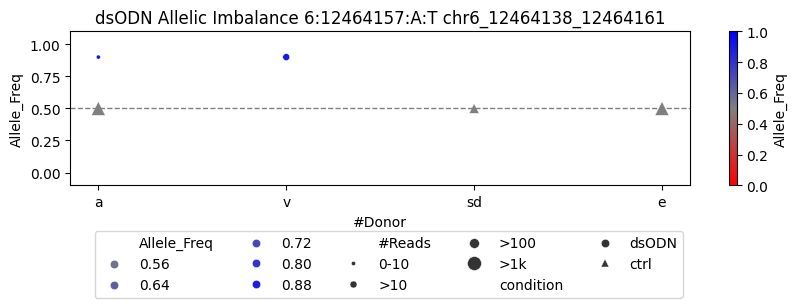

In [275]:
from matplotlib.colors import LinearSegmentedColormap

def AI_plot(donor_id,size_list,VAF_list,condition_list,title,outfile):
    plot_df = pd.DataFrame()
    markers = {"dsODN": "o","indel": "o", "ctrl": '^'}
    plot_df['#Reads'] = size_list
    plot_df['Allele_Freq'] = VAF_list
    plot_df['condition'] = condition_list
    plot_df['x'] = donor_id
    plt.figure(figsize=(10, 2))
    custom_cmap = LinearSegmentedColormap.from_list('custom_cmap', ['red', 'grey', 'blue'])
    plt.axhline(y=0.5, color='grey', linestyle='--', linewidth=1)
    size_dict = {'0-10': 9, '>10': 25, '>100': 50, '>1k': 100}
    # Create the dot plot
    g=sns.scatterplot(
        data=plot_df,
        x='x', 
        y='Allele_Freq',
        size='#Reads', 
        hue='Allele_Freq',
        palette=custom_cmap,
        style="condition",
        markers=markers,
        sizes=size_dict,
        hue_norm=(0,1),
        legend='brief'
    )
    plt.ylim(-0.1,1.1)
    # Customize the plot
    plt.title(title)
    plt.xlabel('#Donor')
    # g.set(xticklabels=[])
    plt.legend(loc='upper right', bbox_to_anchor=(1,-0.25),ncol=5)
    norm = plt.Normalize(0, 1)
    sm = plt.cm.ScalarMappable(cmap=custom_cmap, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=g)
    cbar.set_label('Allele_Freq')
    

    plt.savefig(outfile,bbox_inches='tight')
donor_id=['a','v','sd','a','e']
size_list=['0-10','>10','>100','>1k','>1k']
VAF_list=[0.9,0.9,0.5,0.5,0.5]
condition_list=['dsODN','dsODN','ctrl','ctrl','ctrl']
tital="test"
outfile="test"
AI_plot(donor_id,size_list,VAF_list,condition_list,title,outfile)

In [259]:
def convert_to_range_strings(int_list):
    def get_range_string(num):
        if num <= 10:
            return '0-10'
        elif num <= 100:
            return '>10'
        elif num <= 1000:
            return '>100'
        else:
            return '>1k'
    
    return [get_range_string(num) for num in int_list]

In [285]:
df3

,dsODN_bam_ref,dsODN_bam_alt,indel_bam_ref,indel_bam_alt,control_bam_ref,control_bam_alt,sample_list,P_dsODN_list,P_indel_list,P_dsODN,P_indel,FDR_dsODN,FDR_indel,Total_dsODN,Total_indel,dsODN_AI,indel_AI,AI_score
4:1310782:C:T,"[0, 0]","[0, 0]","[0, 0]","[2, 0]","[11, 6]","[104, 36]","[17, 13]","[1.0, 1.0]","[1.0, 1.0]",1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0,2,0,0,0
14:35389346:T:G,"[166, 235, 214, 309, 157, 181, 145, 294, 56, 1...","[2400, 2408, 2554, 2364, 1870, 2307, 2689, 227...","[237, 310, 264, 340, 200, 240, 205, 365, 88, 1...","[4358, 4211, 4409, 5116, 4157, 4505, 4689, 423...","[10414, 9968, 9344, 9122, 8263, 8091, 9673, 96...","[9801, 9929, 9534, 9802, 8049, 8594, 9194, 982...","[66, 65, 64, 63, 62, 51, 59, 58, 56, 54, 53, 5...","[0.0, 0.0, 0.0, 6.91e-321, 0.0, 0.0, 0.0, 0.0,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,101674,184498,1,1,2
13:102628187:G:A,"[8, 15, 16, 15, 0, 10, 9, 46, 12, 26, 0, 5, 0,...","[49, 62, 88, 22, 17, 106, 33, 60, 36, 16, 0, 6...","[9, 18, 18, 15, 8, 10, 25, 53, 14, 27, 4, 23, ...","[85, 92, 133, 22, 19, 168, 45, 98, 55, 24, 30,...","[18289, 16696, 15287, 16797, 20498, 17496, 183...","[17996, 15126, 15874, 16660, 20317, 17865, 200...","[25, 26, 28, 42, 3, 5, 8, 19, 78, 80, 85, 87, ...","[1.2736537308878649e-08, 3.4126874486890975e-0...","[4.4090989481261153e-17, 5.6373478769390804e-1...",6.006687e-21,1.571409e-37,8.323552e-20,2.177523e-36,1012,1545,1,1,2
3:49421943:T:C,"[0, 10, 20, 4, 0, 3, 8, 6, 0, 5, 1, 4, 3, 27, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[15, 24, 38, 24, 11, 20, 24, 13, 9, 32, 7, 9, ...","[8, 5, 5, 0, 11, 8, 5, 3, 4, 5, 11, 5, 3, 2, 1...","[10734, 9924, 9873, 4876, 10543, 10229, 9936, ...","[10328, 9915, 9858, 4470, 10306, 9574, 9844, 1...","[45, 67, 57, 55, 54, 53, 52, 50, 49, 69, 70, 9...","[1.0, 0.0019487803610937033, 1.890199749193782...","[0.21180793208828197, 0.0005415060708714236, 2...",7.301064e-09,1.112710e-14,6.158289e-08,8.634631e-14,269,1129,1,1,2
1:64133482:A:C,"[506, 138, 215, 31, 196, 276, 473, 284]","[0, 0, 8, 0, 0, 0, 0, 7]","[1069, 426, 571, 39, 452, 677, 831, 466]","[5, 1, 9, 3, 4, 2, 3, 9]","[19473, 1139, 4469, 2818, 3429, 20307, 22027, ...","[18639, 1113, 4382, 2505, 3671, 19433, 20770, ...","[57, 95, 93, 92, 85, 83, 80, 78]","[6.651543967447283e-147, 7.620779723308837e-40...","[7.12811166126916e-295, 4.474448021349943e-110...",6.651544e-147,7.128112e-295,4.301332e-145,1.728567e-293,2134,4567,1,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11:113638937:A:C,[],[],[],[],[],[],[],[],[],1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0,0,0,0,0
6:12464157:A:T,[0],[100],[5],[1634],[16879],[16714],[94],[5.609125048805758e-31],[0.0],5.609125e-31,0.000000e+00,1.088170e-29,0.000000e+00,100,1639,1,1,2
3:52402443:T:G,[],[],[],[],[],[],[],[],[],1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0,0,0,0,0
10:27608840:A:G,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 2, 1, 1, 0, 0, 1, 1, 2, 0, 1, 1, 1, 2, 0, ...","[0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, ...","[19185, 17722, 4695, 20115, 12806, 19506, 1532...","[20057, 17233, 5023, 19394, 13099, 19071, 1501...","[69, 63, 94, 58, 55, 53, 74, 92, 91, 85, 83, 7...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[1.0, 0.500084341764161, 0.4831772816133347, 1...",1.957816e-03,3.852420e-06,7.470082e-03,1.557020e-05,17,64,0,0,0


In [286]:
def getVAF(r):
    dsODN_VAF_list = []
    indel_VAF_list = []
    sample_list = r.sample_list
    for i in range(len(sample_list)):
        dsODN_total = r.dsODN_bam_ref[i]+r.dsODN_bam_alt[i]
        indel_total = r.indel_bam_ref[i]+r.indel_bam_alt[i]
        if dsODN_total>0:
            dsODN_VAF_list.append(r.dsODN_bam_alt[i]/dsODN_total)
        if indel_total>0:
            indel_VAF_list.append(r.indel_bam_alt[i]/indel_total)      
    r['dsODN_VAF_list'] = dsODN_VAF_list
    r['indel_VAF_list'] = indel_VAF_list
    r['mean_dsODN_VAF'] = np.mean(dsODN_VAF_list)
    r['mean_indel_VAF'] = np.mean(indel_VAF_list)
    return r
df4 = df3.apply(getVAF,axis=1)

In [287]:
df4

,dsODN_bam_ref,dsODN_bam_alt,indel_bam_ref,indel_bam_alt,control_bam_ref,control_bam_alt,sample_list,P_dsODN_list,P_indel_list,P_dsODN,...,FDR_indel,Total_dsODN,Total_indel,dsODN_AI,indel_AI,AI_score,dsODN_VAF_list,indel_VAF_list,mean_dsODN_VAF,mean_indel_VAF
4:1310782:C:T,"[0, 0]","[0, 0]","[0, 0]","[2, 0]","[11, 6]","[104, 36]","[17, 13]","[1.0, 1.0]","[1.0, 1.0]",1.000000e+00,...,1.000000e+00,0,2,0,0,0,[],[1.0],NaN,1.000000
14:35389346:T:G,"[166, 235, 214, 309, 157, 181, 145, 294, 56, 1...","[2400, 2408, 2554, 2364, 1870, 2307, 2689, 227...","[237, 310, 264, 340, 200, 240, 205, 365, 88, 1...","[4358, 4211, 4409, 5116, 4157, 4505, 4689, 423...","[10414, 9968, 9344, 9122, 8263, 8091, 9673, 96...","[9801, 9929, 9534, 9802, 8049, 8594, 9194, 982...","[66, 65, 64, 63, 62, 51, 59, 58, 56, 54, 53, 5...","[0.0, 0.0, 0.0, 6.91e-321, 0.0, 0.0, 0.0, 0.0,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.000000e+00,...,0.000000e+00,101674,184498,1,1,2,"[0.9353078721745908, 0.9110858872493379, 0.922...","[0.9484221980413493, 0.931431099314311, 0.9435...",0.914761,0.922316
13:102628187:G:A,"[8, 15, 16, 15, 0, 10, 9, 46, 12, 26, 0, 5, 0,...","[49, 62, 88, 22, 17, 106, 33, 60, 36, 16, 0, 6...","[9, 18, 18, 15, 8, 10, 25, 53, 14, 27, 4, 23, ...","[85, 92, 133, 22, 19, 168, 45, 98, 55, 24, 30,...","[18289, 16696, 15287, 16797, 20498, 17496, 183...","[17996, 15126, 15874, 16660, 20317, 17865, 200...","[25, 26, 28, 42, 3, 5, 8, 19, 78, 80, 85, 87, ...","[1.2736537308878649e-08, 3.4126874486890975e-0...","[4.4090989481261153e-17, 5.6373478769390804e-1...",6.006687e-21,...,2.177523e-36,1012,1545,1,1,2,"[0.8596491228070176, 0.8051948051948052, 0.846...","[0.9042553191489362, 0.8363636363636363, 0.880...",0.838634,0.811779
3:49421943:T:C,"[0, 10, 20, 4, 0, 3, 8, 6, 0, 5, 1, 4, 3, 27, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[15, 24, 38, 24, 11, 20, 24, 13, 9, 32, 7, 9, ...","[8, 5, 5, 0, 11, 8, 5, 3, 4, 5, 11, 5, 3, 2, 1...","[10734, 9924, 9873, 4876, 10543, 10229, 9936, ...","[10328, 9915, 9858, 4470, 10306, 9574, 9844, 1...","[45, 67, 57, 55, 54, 53, 52, 50, 49, 69, 70, 9...","[1.0, 0.0019487803610937033, 1.890199749193782...","[0.21180793208828197, 0.0005415060708714236, 2...",7.301064e-09,...,8.634631e-14,269,1129,1,1,2,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...","[0.34782608695652173, 0.1724137931034483, 0.11...",0.003571,0.252623
1:64133482:A:C,"[506, 138, 215, 31, 196, 276, 473, 284]","[0, 0, 8, 0, 0, 0, 0, 7]","[1069, 426, 571, 39, 452, 677, 831, 466]","[5, 1, 9, 3, 4, 2, 3, 9]","[19473, 1139, 4469, 2818, 3429, 20307, 22027, ...","[18639, 1113, 4382, 2505, 3671, 19433, 20770, ...","[57, 95, 93, 92, 85, 83, 80, 78]","[6.651543967447283e-147, 7.620779723308837e-40...","[7.12811166126916e-295, 4.474448021349943e-110...",6.651544e-147,...,1.728567e-293,2134,4567,1,1,2,"[0.0, 0.0, 0.03587443946188341, 0.0, 0.0, 0.0,...","[0.004655493482309125, 0.00234192037470726, 0....",0.007491,0.016026
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11:113638937:A:C,[],[],[],[],[],[],[],[],[],1.000000e+00,...,1.000000e+00,0,0,0,0,0,[],[],NaN,NaN
6:12464157:A:T,[0],[100],[5],[1634],[16879],[16714],[94],[5.609125048805758e-31],[0.0],5.609125e-31,...,0.000000e+00,100,1639,1,1,2,[1.0],[0.9969493593654668],1.000000,0.996949
3:52402443:T:G,[],[],[],[],[],[],[],[],[],1.000000e+00,...,1.000000e+00,0,0,0,0,0,[],[],NaN,NaN
10:27608840:A:G,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 2, 1, 1, 0, 0, 1, 1, 2, 0, 1, 1, 1, 2, 0, ...","[0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, ...","[19185, 17722, 4695, 20115, 12806, 19506, 1532...","[20057, 17233, 5023, 19394, 13099, 19071, 1501...","[69, 63, 94, 58, 55, 53, 74, 92, 91, 85, 83, 7...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...","[1.0, 0.500084341764161, 0.4831772816133347, 1...",1.957816e-03,...,1.557020e-05,17,64,0,0,0,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0, 0.0, 0.5, 0.0, 1.0, 0.5

17:78315866:GT:G


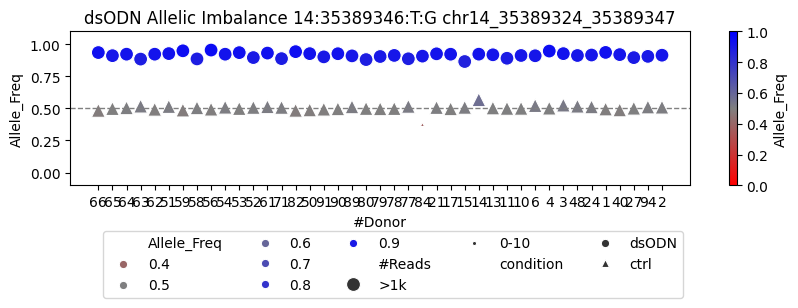

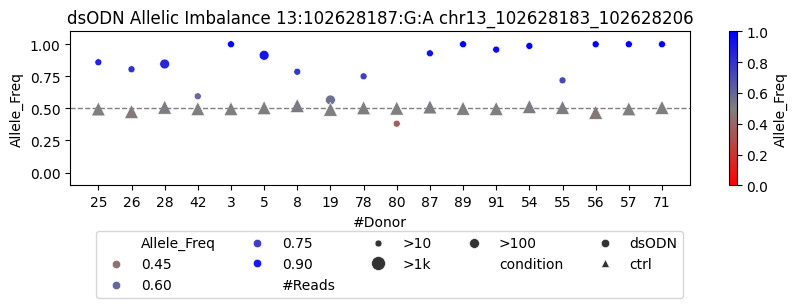

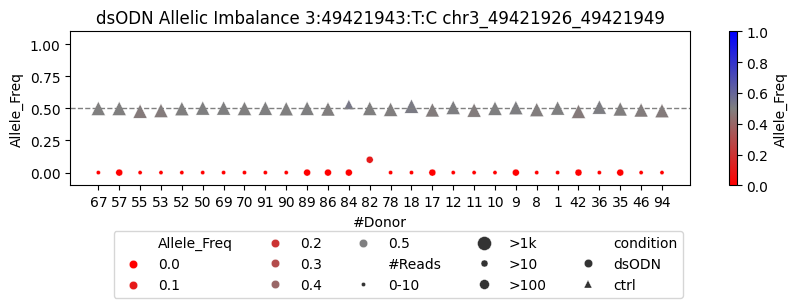

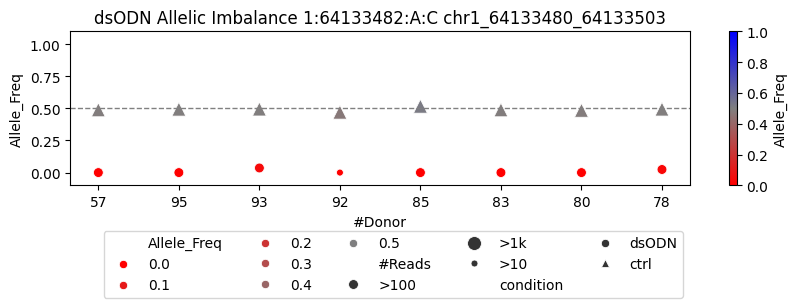

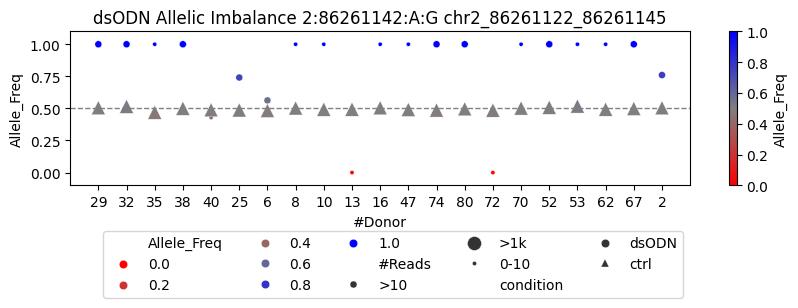

...

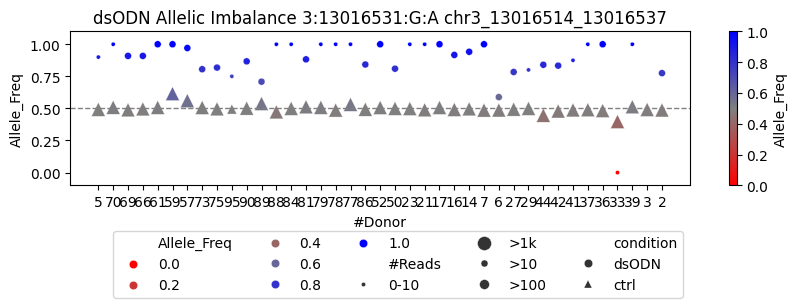

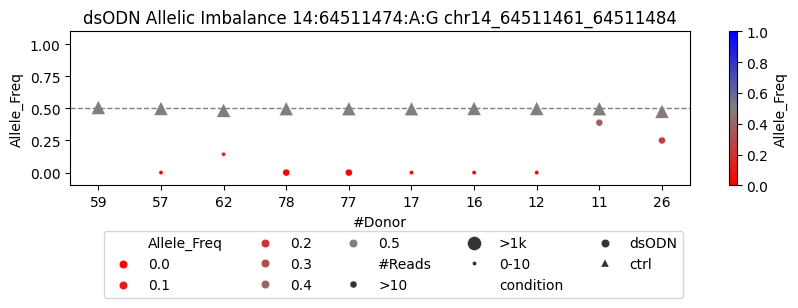

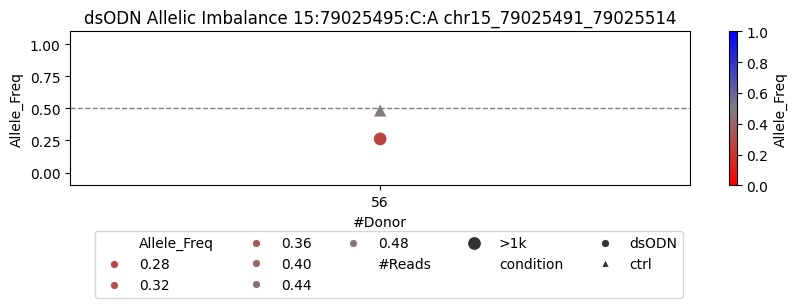

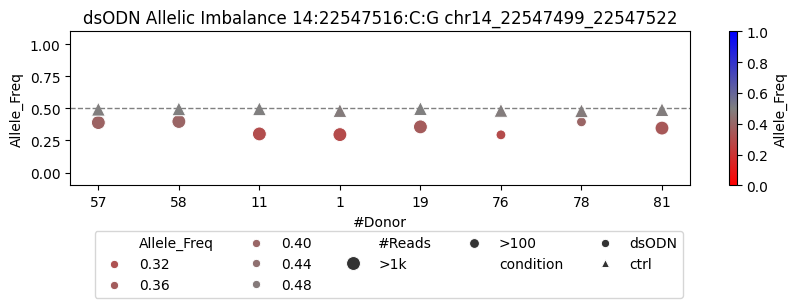

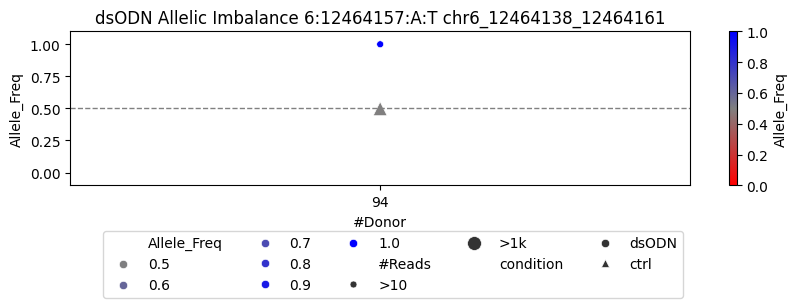

In [276]:
# dsODN_AI
for i,r in stats[stats.is_High_Confidence==1].iterrows():
    ID2 = r.ID2
    OT_name = r.OT_name
    try:
        tmp = df3.loc[ID2]
    except:
        print (ID2)
        continue
    if r.dsODN_AI==0:
        continue
    sample_list = tmp.sample_list
    size_list = []
    condition_list = []
    VAF_list=[]
    donor_list = []
    for i in range(len(sample_list)):
        dsODN_total = tmp.dsODN_bam_ref[i]+tmp.dsODN_bam_alt[i]
        if dsODN_total>0:
            size_list.append(dsODN_total)
            condition_list.append("dsODN")
            VAF_list.append(tmp.dsODN_bam_alt[i]/dsODN_total)
            donor_list.append(sample_list[i])
            control_total = tmp.control_bam_ref[i]+tmp.control_bam_alt[i]
            size_list.append(control_total)
            condition_list.append("ctrl")
            VAF_list.append(tmp.control_bam_alt[i]/control_total)
            donor_list.append(sample_list[i])

    size_list = convert_to_range_strings(size_list)
    title = f'dsODN Allelic Imbalance {ID2} {OT_name}'
    outfile    = f"dsODN_AI_plot_{ID2}_{OT_name}.HC.pdf"
    AI_plot(donor_list,size_list,VAF_list,condition_list,title,outfile)
    # break

17:78315866:GT:G


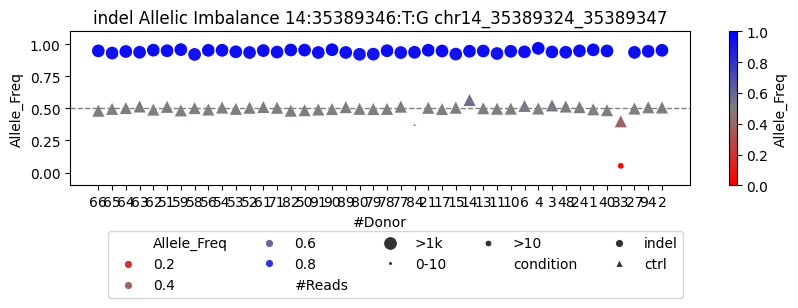

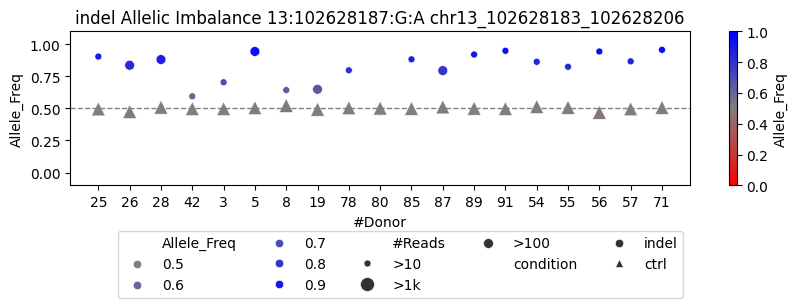

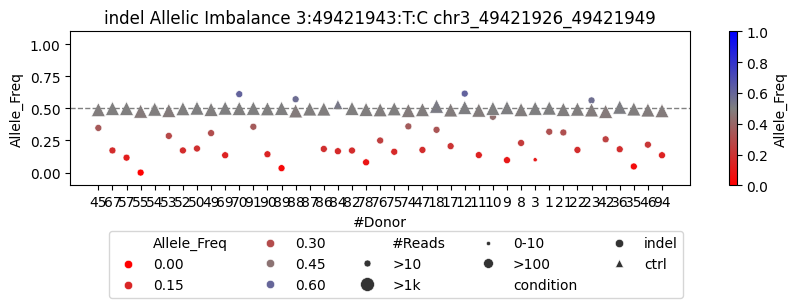

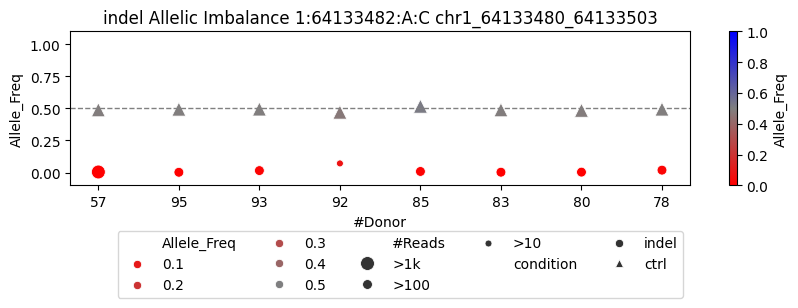

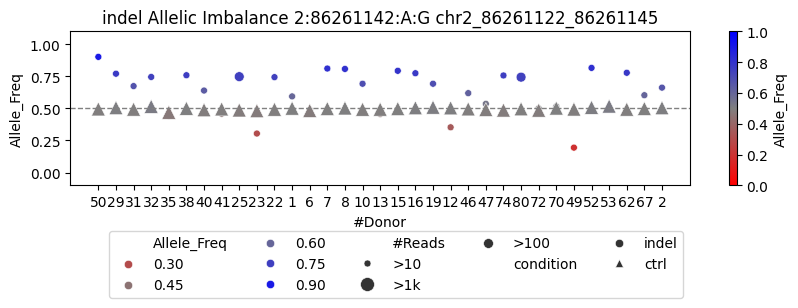

...

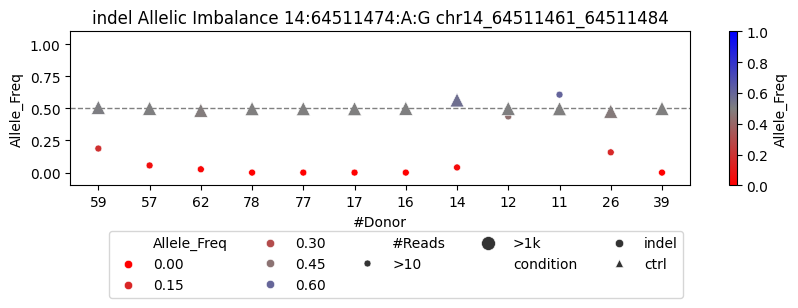

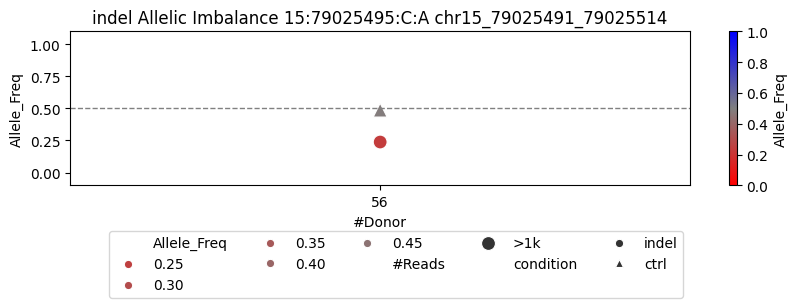

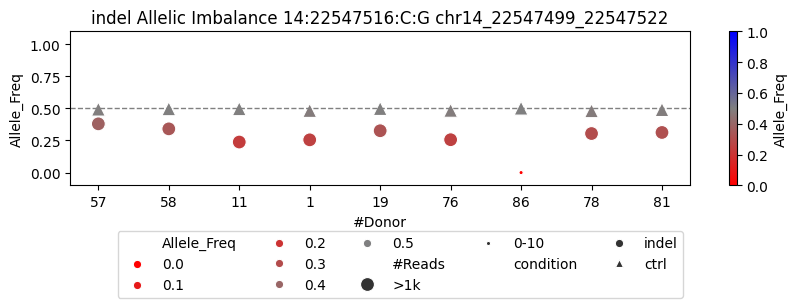

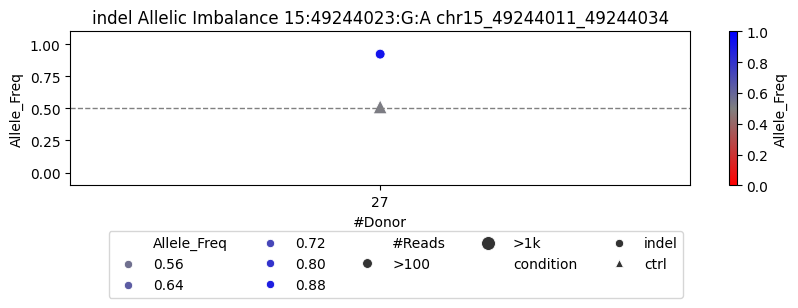

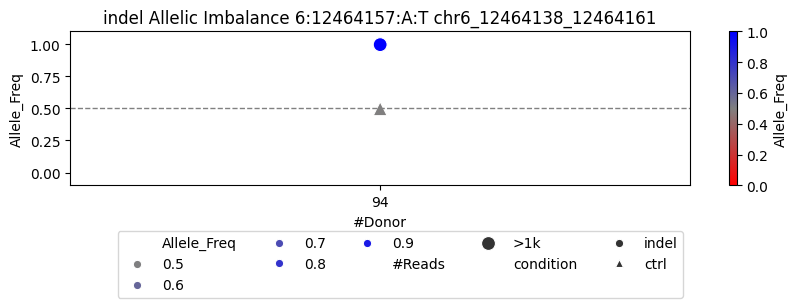

In [277]:
# indel_AI
for i,r in stats[stats.is_High_Confidence==1].iterrows():
    ID2 = r.ID2
    OT_name = r.OT_name
    try:
        tmp = df3.loc[ID2]
    except:
        print (ID2)
        continue
    if r.indel_AI==0:
        continue
    sample_list = tmp.sample_list
    size_list = []
    condition_list = []
    VAF_list=[]
    donor_list = []
    for i in range(len(sample_list)):
        indel_total = tmp.indel_bam_ref[i]+tmp.indel_bam_alt[i]
        if indel_total>0:
            size_list.append(indel_total)
            condition_list.append("indel")
            VAF_list.append(tmp.indel_bam_alt[i]/indel_total)
            donor_list.append(sample_list[i])
            control_total = tmp.control_bam_ref[i]+tmp.control_bam_alt[i]
            size_list.append(control_total)
            condition_list.append("ctrl")
            VAF_list.append(tmp.control_bam_alt[i]/control_total)
            donor_list.append(sample_list[i])

    size_list = convert_to_range_strings(size_list)
    title = f'indel Allelic Imbalance {ID2} {OT_name}'
    outfile    = f"indel_AI_plot_{ID2}_{OT_name}.HC.pdf"
    AI_plot(donor_list,size_list,VAF_list,condition_list,title,outfile)
    # break

8:1944109:CTGTGTCGCC:C
5:181104724:CT:C
11:117947004:TC:T
19:33133242:AAGAAGG:A
8:11854593:T:TTCAAACAAT
9:23855627:CT:C
9:23855628:C:CT
4:114252494:AT:A
12:80031812:GAA:G
12:80031817:C:CGATTTCCTG
18:79887165:CAA:C
18:79887168:GGACACAGGG:G
19:33133263:AC:A
2:1587699:TGTCCCCATC:T
15:65401579:AGGATGGGGA:A
16:13023014:TTTTA:T
2:1587710:TGTCCCTCTG:T


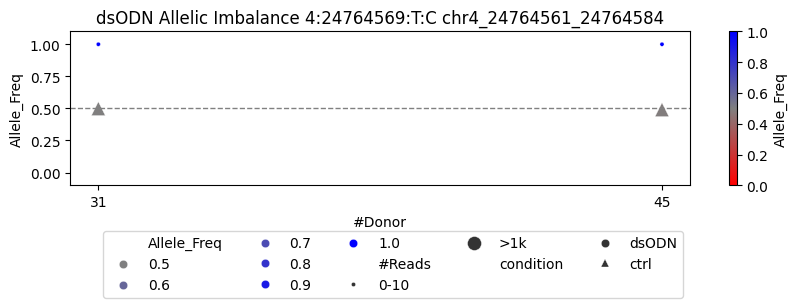

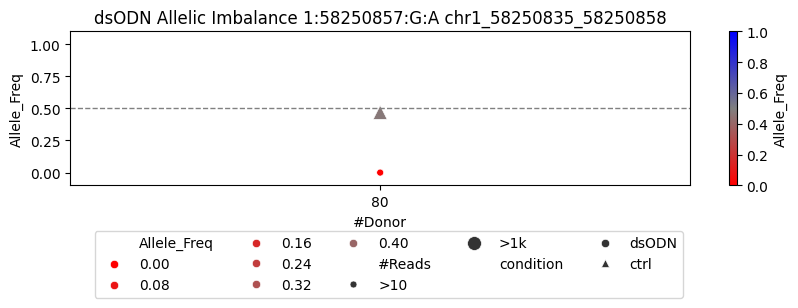

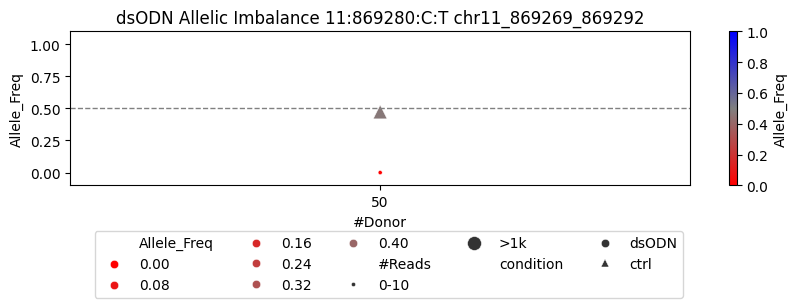

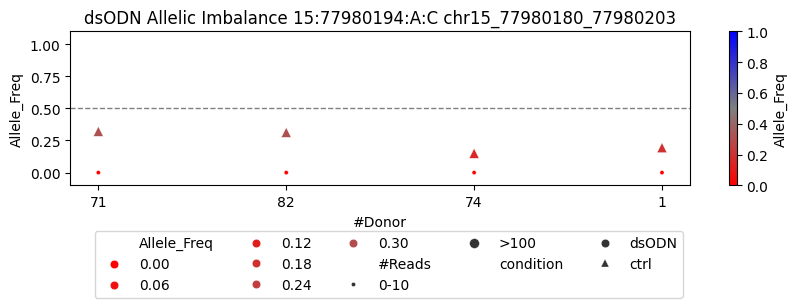

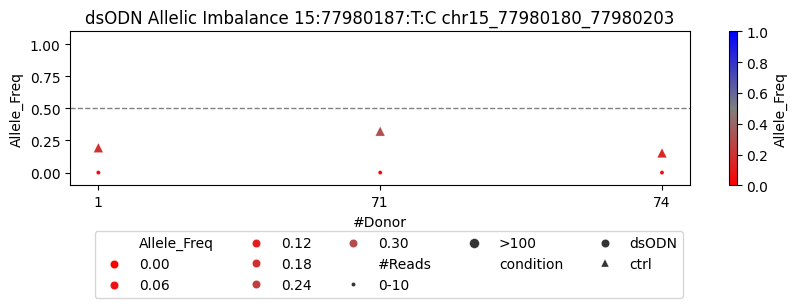

...

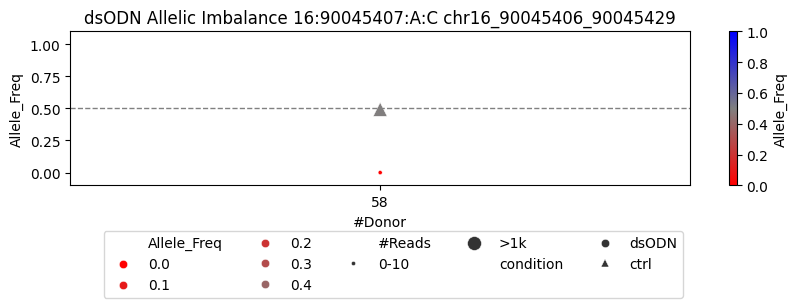

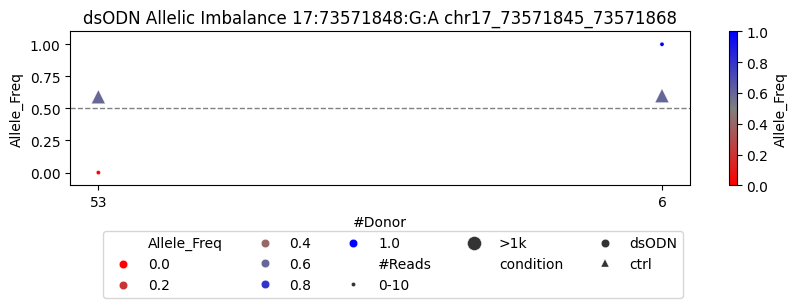

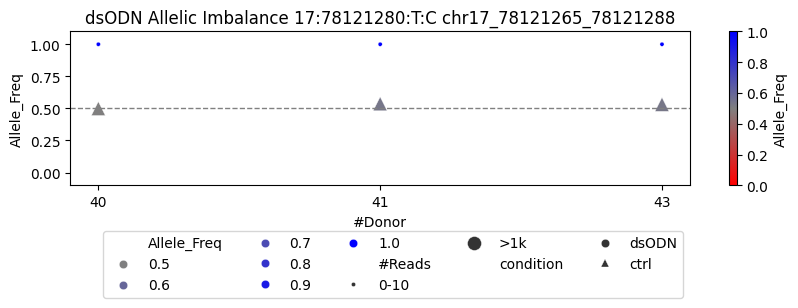

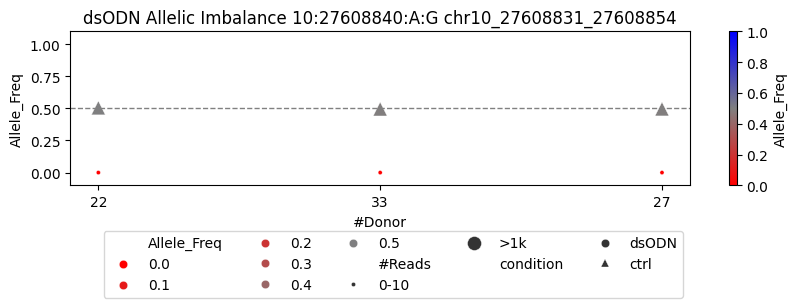

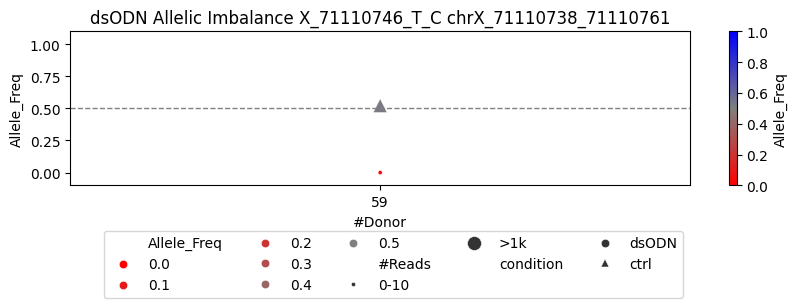

In [283]:
# dsODN_AI
for i,r in stats[stats.is_High_Confidence!=1].iterrows():
    ID2 = r.ID2
    OT_name = r.OT_name
    try:
        tmp = df3.loc[ID2]
    except:
        print (ID2)
        continue
    if r.dsODN_AI==1:
        continue
    sample_list = tmp.sample_list
    size_list = []
    condition_list = []
    VAF_list=[]
    donor_list = []
    for i in range(len(sample_list)):
        dsODN_total = tmp.dsODN_bam_ref[i]+tmp.dsODN_bam_alt[i]
        if dsODN_total>0:
            size_list.append(dsODN_total)
            condition_list.append("dsODN")
            VAF_list.append(tmp.dsODN_bam_alt[i]/dsODN_total)
            donor_list.append(sample_list[i])
            control_total = tmp.control_bam_ref[i]+tmp.control_bam_alt[i]
            size_list.append(control_total)
            condition_list.append("ctrl")
            VAF_list.append(tmp.control_bam_alt[i]/control_total)
            donor_list.append(sample_list[i])

    size_list = convert_to_range_strings(size_list)
    title = f'dsODN Allelic Imbalance {ID2} {OT_name}'
    outfile    = f"dsODN_AI_plot_{ID2}_{OT_name}.LC.pdf"
    if len(donor_list)>0:
        AI_plot(donor_list,size_list,VAF_list,condition_list,title,outfile)
    # break

8:1944109:CTGTGTCGCC:C
5:181104724:CT:C
11:117947004:TC:T
19:33133242:AAGAAGG:A
8:11854593:T:TTCAAACAAT
9:23855627:CT:C
9:23855628:C:CT
4:114252494:AT:A
12:80031812:GAA:G
12:80031817:C:CGATTTCCTG
18:79887165:CAA:C
18:79887168:GGACACAGGG:G
19:33133263:AC:A
2:1587699:TGTCCCCATC:T
15:65401579:AGGATGGGGA:A
16:13023014:TTTTA:T
2:1587710:TGTCCCTCTG:T


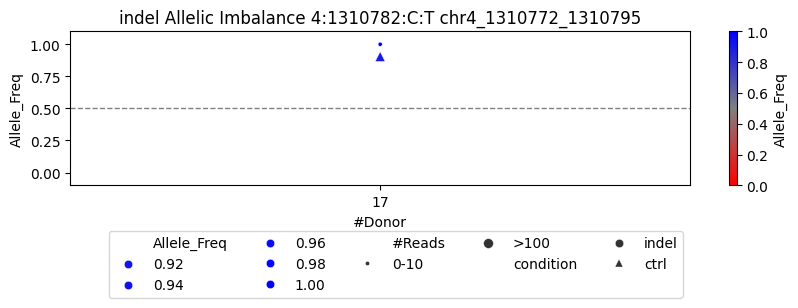

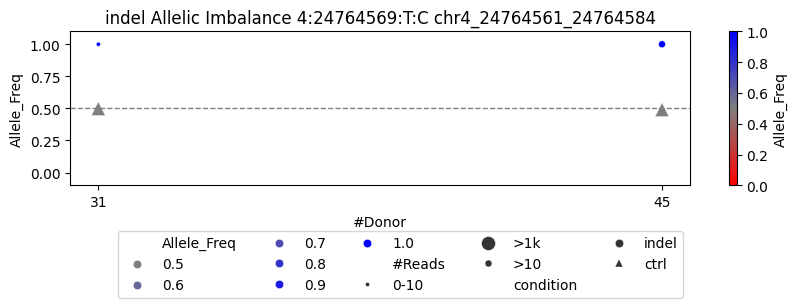

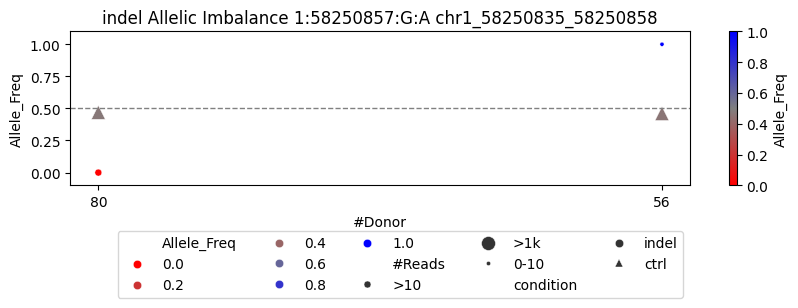

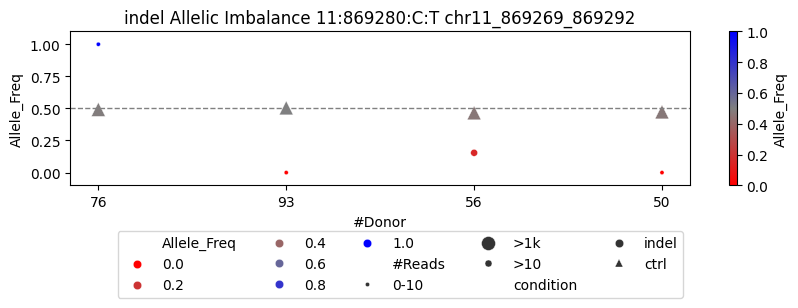

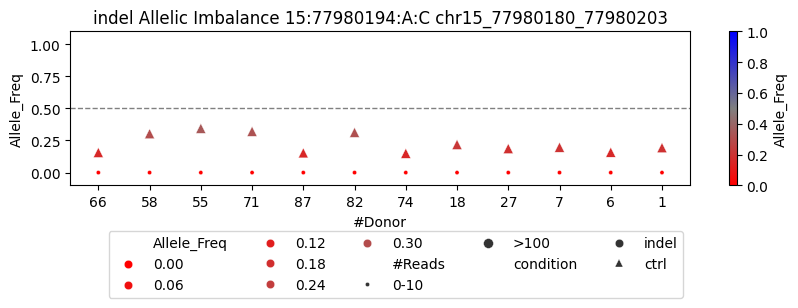

...

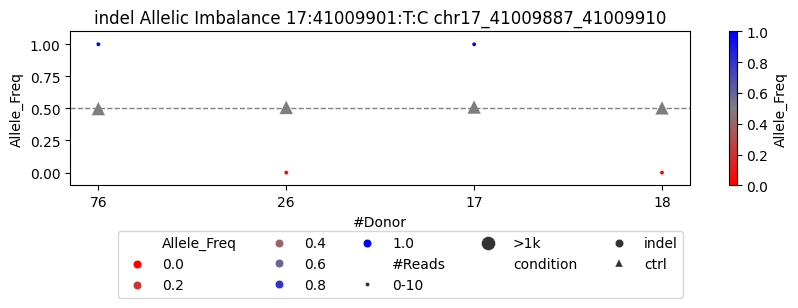

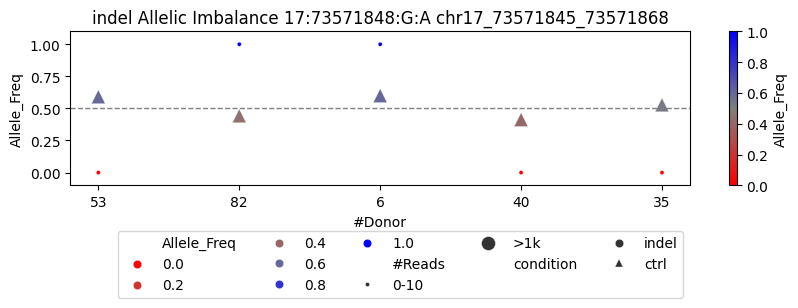

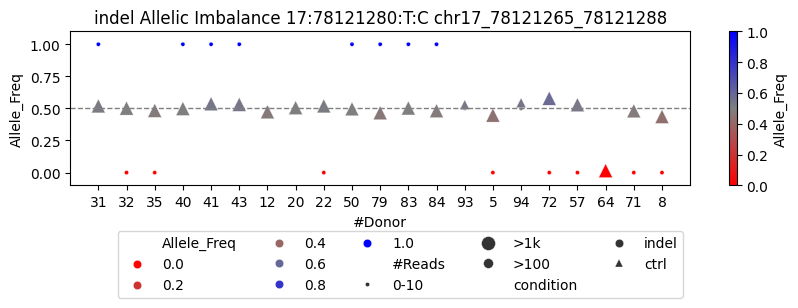

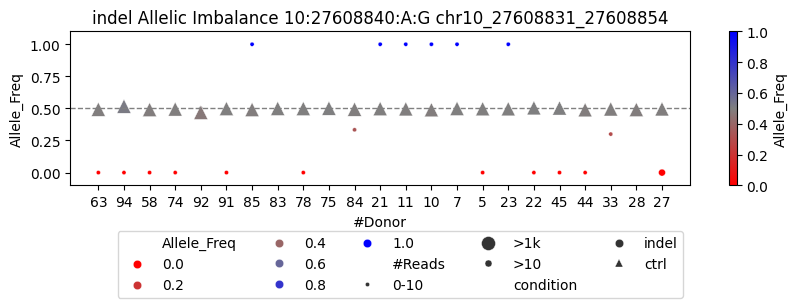

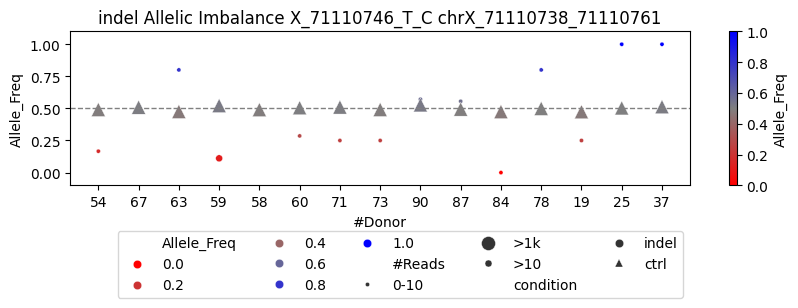

In [282]:
# indel_AI
for i,r in stats[stats.is_High_Confidence!=1].iterrows():
    ID2 = r.ID2
    OT_name = r.OT_name
    try:
        tmp = df3.loc[ID2]
    except:
        print (ID2)
        continue
    if r.indel_AI==1:
        continue
    sample_list = tmp.sample_list
    size_list = []
    condition_list = []
    VAF_list=[]
    donor_list = []
    for i in range(len(sample_list)):
        indel_total = tmp.indel_bam_ref[i]+tmp.indel_bam_alt[i]
        if indel_total>0:
            size_list.append(indel_total)
            condition_list.append("indel")
            VAF_list.append(tmp.indel_bam_alt[i]/indel_total)
            donor_list.append(sample_list[i])
            control_total = tmp.control_bam_ref[i]+tmp.control_bam_alt[i]
            size_list.append(control_total)
            condition_list.append("ctrl")
            VAF_list.append(tmp.control_bam_alt[i]/control_total)
            donor_list.append(sample_list[i])

    size_list = convert_to_range_strings(size_list)
    title = f'indel Allelic Imbalance {ID2} {OT_name}'
    outfile    = f"indel_AI_plot_{ID2}_{OT_name}.LC.pdf"
    if len(donor_list)>0:
        AI_plot(donor_list,size_list,VAF_list,condition_list,title,outfile)
    # break

In [2]:
def revcomp(seq):
	try: ## python2
		tab = string.maketrans(b"ACTG", b"TGAC")
	except:  ## python3
		tab = bytes.maketrans(b"ACTG", b"TGAC")
	return seq.translate(tab)[::-1]


In [3]:
gdf5 = pd.read_csv("gdf5.csv")
gdf5

,#chr,start,end,seq_x,OT_name,strand_x,gRNA_x,Sample_ID,donor_x,Population,...,BETA,Variant_Effect,SE,T_STAT,P,nlogp,inside,PAM_pos,variant_pos,GT
0,chr4,1310772.0,1310795.0,CGGCCCTGAGCCCGTTCCCCCGG,chr4_1310772_1310795,-,CXCR4_site_8,NA19734,65.0,MXL,...,5.78056,5.78056,0.213283,27.1028,6.288650e-46,45.201443,1,1310775,-7,0
1,chr4,1310772.0,1310795.0,CGGCCCTGAGCCCGTTCCCCCGG,chr4_1310772_1310795,-,CXCR4_site_8,NA19731,63.0,MXL,...,5.78056,5.78056,0.213283,27.1028,6.288650e-46,45.201443,1,1310775,-7,0
2,chr4,1310772.0,1310795.0,CGGCCCTGAGCCCGTTCCCCCGG,chr4_1310772_1310795,-,CXCR4_site_8,NA19732,64.0,MXL,...,5.78056,5.78056,0.213283,27.1028,6.288650e-46,45.201443,1,1310775,-7,0
3,chr4,1310772.0,1310795.0,CGGCCCTGAGCCCGTTCCCCCGG,chr4_1310772_1310795,-,CXCR4_site_8,NA19741,66.0,MXL,...,5.78056,5.78056,0.213283,27.1028,6.288650e-46,45.201443,1,1310775,-7,0
4,chr4,1310772.0,1310795.0,CGGCCCTGAGCCCGTTCCCCCGG,chr4_1310772_1310795,-,CXCR4_site_8,NA19652,50.0,MXL,...,5.78056,5.78056,0.213283,27.1028,6.288650e-46,45.201443,1,1310775,-7,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20387,chr3,52402427.0,52402450.0,AGAGGTAGAGACCCTTGAGCAGG,chr3_52402427_52402450,+,LAG3_site_9,NA19918,80.0,ASW,...,0.00000,0.00000,NaN,NaN,1.000000e+00,-0.000000,1,52402448,-5,0
20388,chr3,52402427.0,52402450.0,AGAGGTAGAGACCCTTGAGCAGG,chr3_52402427_52402450,+,LAG3_site_9,NA19919,81.0,ASW,...,0.00000,0.00000,NaN,NaN,1.000000e+00,-0.000000,1,52402448,-5,0
20389,chr3,52402427.0,52402450.0,AGAGGTAGAGACCCTTGAGCAGG,chr3_52402427_52402450,+,LAG3_site_9,NA19920,82.0,ASW,...,0.00000,0.00000,NaN,NaN,1.000000e+00,-0.000000,1,52402448,-5,0
20390,chr3,52402427.0,52402450.0,AGAGGTAGAGACCCTTGAGCAGG,chr3_52402427_52402450,+,LAG3_site_9,NA19924,84.0,ASW,...,0.00000,0.00000,NaN,NaN,1.000000e+00,-0.000000,1,52402448,-5,0


In [4]:
df = pd.read_csv("G1000_donor95_GUIDE_seq_overlap.Variant_info.PLINK_stats.Allelic_Imbalance_summary.csv")
df.head()

,#CHROM,POS,ID,REF,ALT,Variant_mutation_type,MAF_EUR_unrel,MAF_EAS_unrel,MAF_AMR_unrel,MAF_SAS_unrel,...,rhamp_seq_integration_FDR_BH,#HET_donor,GUIDE_seq_mean_VAF_HET,Rhamp_seq_nuclease_mean_VAF_HET,Rhamp_seq_control_mean_VAF_HET,Rhamp_seq_AI_p_value,Rhamp_seq_AI_FDR,#HET_donor_GUIDEseq_has_reads,#HET_donor_total,Rhamp_seq_dsODN_reads_mean_VAF_HET
0,chr4,1310782,4:1310782:C:T,C,T,SNP,0.040756,0.000000,0.021614,0.009202,...,NaN,2.0,1.000000,0.833035,0.880745,1.952667e-02,4.567757e-02,2.0,2.0,1.000000
1,chr14,35389346,14:35389346:T:G,T,G,SNP,0.180915,0.058532,0.370317,0.210634,...,1.003646e-52,42.0,0.977655,0.405946,0.499502,0.000000e+00,0.000000e+00,42.0,42.0,0.977655
2,chr13,102628187,13:102628187:G:A,G,A,SNP,0.136183,0.134921,0.113833,0.139059,...,7.126032e-27,19.0,0.447368,0.497976,0.500587,2.121967e-14,4.042676e-13,19.0,19.0,0.447368
3,chr3,49421943,3:49421943:T:C,T,C,SNP,0.431412,0.088294,0.384726,0.258691,...,4.267828e-13,41.0,0.000000,0.500315,0.495586,2.803942e-09,2.894795e-08,41.0,41.0,0.000000
4,chr1,64133482,1:64133482:A:C,A,C,SNP,0.002982,0.000000,0.025937,0.000000,...,1.121229e-04,8.0,0.001863,0.510738,0.491872,2.414852e-21,6.030604e-20,8.0,8.0,0.001863


In [7]:
set(df.ID2)-set(gdf5.ID)

set()

In [9]:
import warnings
warnings.filterwarnings('ignore')

In [175]:
import re
def read_rhamp_dsODN_bam(gRNA,donor,chr,pos):
    template =f"/home/yli11/dirs/02172023_GUIDEseq2_GV_Novaseq/rhamp_seq_validation/dsODN_bam_files/bam_indel_dsODN_yli11_2023-12-07/{gRNA}_*_D{int(donor)}_*tsv"
#     print (template)
    file = glob.glob(template)
    if len(file)==0:
        return pd.DataFrame(columns=[0,1,2,3,'A','C','G','T'])
    file = [i for i in file if "ctrls" not in i ]
    file =file[0]
    try:
        gt = pd.read_csv(file,sep="\t",header=None,usecols=list(range(10)))
    except:
        x=open(file).readlines()
        if x!=[]:
            print (file)
        return pd.DataFrame(columns=[0,1,2,3,'A','C','G','T'])
    gt = gt.drop_duplicates([0,1])
    gt[2] = gt[2].apply(lambda x:x.upper())
    gt['A'] = [int(x.split(":")[1]) for x in gt[5]]
    gt['C'] = [int(x.split(":")[1]) for x in gt[6]]    
    gt['G'] = [int(x.split(":")[1]) for x in gt[7]]    
    gt['T'] = [int(x.split(":")[1]) for x in gt[8]] 
    gt.index = gt[0]+"_"+gt[1].astype(str) 
    gt = gt[gt[0]==chr]
    gt = gt[gt[1]==pos]
    return gt[[0,1,2,3,'A','C','G','T']]
def get_AI_rhamp_dsODN(variant_ID):
    tmp = gdf5[(gdf5.ID==variant_ID)&(gdf5.Genotype!="0|0")&(gdf5.Genotype!="1|1")][['ID','Genotype','donor_x','gRNA_x','value']]
																											  
    ref_count_list = []
    alt_count_list = []
    ratio_list = []
    sample_list = []
    if tmp.shape[0]==0:
        return ref_count_list,alt_count_list,ratio_list,sample_list
				  
    for i,r in tmp.iterrows():
        chr,pos,ref,alt = re.split(":|_",r.ID)
        pos = int(pos)
        chr = "chr"+chr
        gRNA = (r.gRNA_x).split("_")[0]
        donor = str(int(r.donor_x))
#         gt_guide = read_GUIDE_bam(gRNA,donor,chr,pos)
        gt_rhamp = read_rhamp_dsODN_bam(gRNA,donor,chr,pos)
#         gt_rhamp_control = read_rhamp_control_bam(gRNA,donor,chr,pos)        

        if gt_rhamp.shape[0]>0:
            gt_rhamp['ratio'] = (gt_rhamp[alt]+1)/(gt_rhamp[ref]+1)
            ref_count_list+=gt_rhamp[ref].tolist()
            alt_count_list+=gt_rhamp[alt].tolist()
            ratio_list += gt_rhamp["ratio"].tolist()
									 
			 
									 
									 
									 
            sample_list.append(donor)
    return ref_count_list,alt_count_list,sample_list,np.mean(ratio_list)
get_AI_rhamp_dsODN("2:86261142:A:G")


([0, 0, 0, 0, 4, 7, 7, 0, 0, 8, 0, 0, 0, 0, 6, 0, 0, 0, 0, 0, 6],
 [12, 21, 2, 11, 3, 20, 9, 2, 7, 0, 3, 8, 15, 40, 0, 9, 33, 1, 3, 11, 19],
 ['29',
  '32',
  '35',
  '38',
  '40',
  '25',
  '6',
  '8',
  '10',
  '13',
  '16',
  '47',
  '74',
  '80',
  '72',
  '70',
  '52',
  '53',
  '62',
  '67',
  '2'],
 9.561243386243387)

pdfunite indel_AI_plot*HC.pdf indel_AI_plot.merged.HC.pdf


In [169]:
import re
def read_rhamp_dsODN_bam(gRNA,donor,chr,pos):
    template =f"/home/yli11/dirs/02172023_GUIDEseq2_GV_Novaseq/rhamp_seq_validation/dsODN_bam_files/bam_indel_dsODN_yli11_2023-12-07/{gRNA}_*_D{int(donor)}_*tsv"
#     print (template)
    file = glob.glob(template)
    if len(file)==0:
        return None
    file = [i for i in file if "ctrls" not in i ]
#     [f(x) for x in sequence if condition]

    file =file[0]
    # print (file)
    gt = pd.read_csv(file,sep="\t",header=None,usecols=list(range(10)))
    gt = gt.drop_duplicates([0,1])
    gt[2] = gt[2].apply(lambda x:x.upper())
    gt['A'] = [int(x.split(":")[1]) for x in gt[5]]
    gt['C'] = [int(x.split(":")[1]) for x in gt[6]]    
    gt['G'] = [int(x.split(":")[1]) for x in gt[7]]    
    gt['T'] = [int(x.split(":")[1]) for x in gt[8]] 
    gt.index = gt[0]+"_"+gt[1].astype(str) 
    gt = gt[gt[0]==chr]
    gt = gt[gt[1]==pos]
    return gt[[0,1,2,3,'A','C','G','T']]
def get_AI_rhamp_dsODN(variant_ID):
    tmp = gdf5[(gdf5.ID==variant_ID)&(gdf5.Genotype!="0|0")&(gdf5.Genotype!="1|1")][['ID','Genotype','donor_x','gRNA_x','value']]
																											  
    ref_count_list = []
    alt_count_list = []
    ratio_list = []
    sample_list = []
    if tmp.shape[0]==0:
        return ref_count_list,alt_count_list,ratio_list,sample_list
				  
    for i,r in tmp.iterrows():
        chr,pos,ref,alt = re.split(":|_",r.ID)
        pos = int(pos)
        chr = "chr"+chr
        gRNA = (r.gRNA_x).split("_")[0]
        donor = str(int(r.donor_x))
#         gt_guide = read_GUIDE_bam(gRNA,donor,chr,pos)
        gt_rhamp = read_rhamp_dsODN_bam(gRNA,donor,chr,pos)
#         gt_rhamp_control = read_rhamp_control_bam(gRNA,donor,chr,pos)        

        if gt_rhamp.shape[0]>0:
            gt_rhamp['ratio'] = (gt_rhamp[alt]+1)/(gt_rhamp[ref]+1)
            ref_count_list+=gt_rhamp[ref].tolist()
            alt_count_list+=gt_rhamp[alt].tolist()
            ratio_list += gt_rhamp["ratio"].tolist()
									 
			 
									 
									 
									 
            sample_list.append(donor)
    return ref_count_list,alt_count_list,sample_list,np.mean(ratio_list)
# get_AI_rhamp_dsODN("1:64133482:A:C")
out = []
out_index=[]
for i,r in df[df.Variant_mutation_type=="SNP"].iterrows():
    try:
        current_line = []
        current_line+= get_AI_rhamp_dsODN(r.ID2)
        # print (current_line)
        out.append(current_line)
        out_index.append(r.ID2)
    except Exception as e:
        print (e)
        print (r.ID2)
df2 = pd.DataFrame(out)
df2.index=out_index    

No columns to parse from file
2:86261142:A:G
No columns to parse from file
3:143084408:A:G
No columns to parse from file
5:38724822:C:G
No columns to parse from file
1:64133488:G:A
No columns to parse from file
8:23551873:T:G
No columns to parse from file
14:64511474:A:G
No columns to parse from file
2:232370075:T:C
No columns to parse from file
1:25337098:T:C
No columns to parse from file
19:48876705:T:C
No columns to parse from file
2:227595968:A:G
No columns to parse from file
19:58452163:G:A
No columns to parse from file
16:13022995:G:C
No columns to parse from file
6:129995501:T:C
No columns to parse from file
15:89933470:A:T
No columns to parse from file
19:51368599:G:A
No columns to parse from file
2:69498929:T:C
No columns to parse from file
14:22547516:C:G
No columns to parse from file
3:53178558:C:G
No columns to parse from file
5:116358713:C:G
No columns to parse from file
12:106237017:G:A
No columns to parse from file
10:133087303:T:G
No columns to parse from file
11:157822

In [12]:
from scipy.stats import binom_test

In [19]:
total_count = 100
count = total_count*0.1
binom_test(count, total_count, 0.5)

3.0632901754379845e-17

In [20]:
from statsmodels.stats import multitest

In [ ]:
FDR = multitest.fdrcorrection(tmp[c].tolist())[1].tolist()

In [87]:
def get_individual_VAF(ref,alt):
    return (alt+1)/(ref+alt+2)

In [85]:
df2

,0,1,2,3
4:1310782:C:T,[],[],[],NaN
14:35389346:T:G,"[166, 235, 214, 309, 157, 181, 145, 294, 56, 1...","[2400, 2408, 2554, 2364, 1870, 2307, 2689, 227...","[66, 65, 64, 63, 62, 51, 59, 58, 56, 54, 53, 5...",11.350168
13:102628187:G:A,"[8, 15, 16, 15, 0, 10, 9, 46, 12, 26, 5, 0, 2,...","[49, 62, 88, 22, 17, 106, 33, 60, 36, 16, 66, ...","[25, 26, 28, 42, 3, 5, 8, 19, 78, 80, 87, 89, ...",14.600006
3:49421943:T:C,"[0, 10, 20, 4, 0, 3, 8, 6, 5, 1, 4, 3, 27, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[45, 67, 57, 55, 54, 53, 52, 50, 69, 70, 91, 9...",0.354386
1:64133482:A:C,"[506, 138, 215, 31, 196, 276, 473, 284]","[0, 0, 8, 0, 0, 0, 0, 7]","[57, 95, 93, 92, 85, 83, 80, 78]",0.015119
...,...,...,...,...
11:113638937:A:C,[],[],[],NaN
6:12464157:A:T,[0],[100],[94],101.0
3:52402443:T:G,[],[],[],NaN
10:27608840:A:G,"[3, 4, 10]","[0, 0, 0]","[22, 33, 27]",0.180303


In [88]:
# total REF, total ALT, N_count_HET_donor, p_value, mean_VAF
rhamp_dsODN_df = []
for i,r in df2.iterrows():
    if len(r[0])==0:
        continue
    total_REF = sum(r[0])
    total_ALT = sum(r[1])
    N_donor = len(r[0])
    total = total_REF+total_ALT
    p = binom_test(total_ALT, total, 0.5)
    mean_VAF = total_ALT/(total)
    VAF_list = [get_individual_VAF(r[0][i],r[1][i]) for i in range(N_donor)]
    total_list = [r[0][i]+r[1][i] for i in range(N_donor)]
    rhamp_dsODN_df.append([i,total_REF,total_ALT,total,total_list,VAF_list,mean_VAF,N_donor,p])

In [89]:
rhamp_dsODN_df = pd.DataFrame(rhamp_dsODN_df)
rhamp_dsODN_df

,0,1,2,3,4,5,6,7,8
0,14:35389346:T:G,8673,93001,101674,"[2566, 2643, 2768, 2673, 2027, 2488, 2834, 257...","[0.9349688473520249, 0.9107750472589792, 0.922...",0.914698,41,0.000000e+00
1,13:102628187:G:A,174,838,1012,"[57, 77, 104, 37, 17, 116, 42, 106, 48, 42, 71...","[0.847457627118644, 0.7974683544303798, 0.8396...",0.828063,18,9.759326e-105
2,3:49421943:T:C,266,3,269,"[0, 10, 20, 4, 0, 3, 8, 6, 5, 1, 4, 3, 27, 0, ...","[0.5, 0.08333333333333333, 0.04545454545454545...",0.011152,37,6.840642e-75
3,1:64133482:A:C,2119,15,2134,"[506, 138, 223, 31, 196, 276, 473, 291]","[0.001968503937007874, 0.007142857142857143, 0...",0.007029,8,0.000000e+00
4,11:87771026:T:C,0,92,92,"[48, 38, 6]","[0.98, 0.975, 0.875]",1.000000,3,4.038968e-28
...,...,...,...,...,...,...,...,...,...
57,17:78121280:T:C,0,15,15,"[7, 1, 7]","[0.8888888888888888, 0.6666666666666666, 0.888...",1.000000,3,6.103516e-05
58,15:49244023:G:A,0,23,23,[23],[0.96],1.000000,1,2.384186e-07
59,6:12464157:A:T,0,100,100,[100],[0.9901960784313726],1.000000,1,1.577722e-30
60,10:27608840:A:G,17,0,17,"[3, 4, 10]","[0.2, 0.16666666666666666, 0.08333333333333333]",0.000000,3,1.525879e-05


In [90]:
rhamp_dsODN_df['FDR'] = multitest.fdrcorrection(rhamp_dsODN_df[8].tolist())[1].tolist()

In [91]:
rhamp_dsODN_df.sort_values("FDR")

,0,1,2,3,4,5,6,7,8,FDR
0,14:35389346:T:G,8673,93001,101674,"[2566, 2643, 2768, 2673, 2027, 2488, 2834, 257...","[0.9349688473520249, 0.9107750472589792, 0.922...",0.914698,41,0.000000e+00,0.000000e+00
3,1:64133482:A:C,2119,15,2134,"[506, 138, 223, 31, 196, 276, 473, 291]","[0.001968503937007874, 0.007142857142857143, 0...",0.007029,8,0.000000e+00,0.000000e+00
12,4:74235294:T:G,87,2665,2752,"[1319, 1433]","[0.9613928841786525, 0.9735191637630662]",0.968387,2,0.000000e+00,0.000000e+00
15,14:90593865:T:C,1918,220,2138,"[615, 688, 711, 124]","[0.09238249594813615, 0.1246376811594203, 0.11...",0.102900,4,0.000000e+00,0.000000e+00
6,5:170084409:C:T,486,16,502,"[70, 227, 205]","[0.013888888888888888, 0.004366812227074236, 0...",0.031873,3,9.642447e-122,1.195663e-120
...,...,...,...,...,...,...,...,...,...,...
32,10:44202582:T:G,10,14,24,"[5, 6, 4, 9]","[0.14285714285714285, 0.875, 0.833333333333333...",0.583333,4,5.412562e-01,5.785842e-01
34,5:170084423:G:T,456,439,895,"[489, 406]","[0.4908350305498982, 0.49019607843137253]",0.490503,2,5.927983e-01,6.229406e-01
41,3:16349946:A:G,3,3,6,"[3, 3]","[0.8, 0.2]",0.500000,2,1.000000e+00,1.000000e+00
53,15:58449649:C:T,0,1,1,[1],[0.6666666666666666],1.000000,1,1.000000e+00,1.000000e+00


In [92]:
rhamp_dsODN_df.columns = ['ID2','Total_REF','Total_ALT','Total','total_list','VAF_HET_donors','VAF','N_donor_with_reads','binom_P','binom_FDR']

In [93]:
rhamp_dsODN_df.to_csv("rhamp_dsODN_AI_stats.csv")

In [67]:
guide_AI = pd.read_csv("guide_AI.correct.csv")
guide_AI['Total'] = guide_AI.GUIDE_REF+guide_AI.GUIDE_ALT
def get_individual_VAF(r):
    ref = r.GUIDE_REF
    alt = r.GUIDE_ALT
    if ref==-1:
        ref=0
    if alt==-1:
        alt=0
    return (alt+1)/(ref+alt+2)
guide_AI['Variant_AF'] = guide_AI.apply(get_individual_VAF,axis=1)
guide_AI

,Unnamed: 0,GUIDE_REF,GUIDE_ALT,GUIDE_ratio,GUIDE_donor,Variant_AF,Total
0,1:64133482:A:C,829.0,0.0,0.001205,80.0,0.001203,829.0
1,1:64133488:G:A,1466.0,1.0,0.001363,90.0,0.001361,1467.0
2,1:64133482:A:C,630.0,0.0,0.001585,78.0,0.001582,630.0
3,3:53178558:C:G,567.0,0.0,0.001761,84.0,0.001757,567.0
4,1:64133482:A:C,1125.0,1.0,0.001776,57.0,0.001773,1126.0
...,...,...,...,...,...,...,...
2173,X_71110746_T_C,-1.0,-1.0,NaN,25.0,0.500000,-2.0
2174,X_71110746_T_C,-1.0,-1.0,NaN,42.0,0.500000,-2.0
2175,X_71110746_T_C,-1.0,-1.0,NaN,37.0,0.500000,-2.0
2176,11:113638937:A:C,-1.0,-1.0,NaN,30.0,0.500000,-2.0


In [82]:
guide_AI_df = []
for s,d in guide_AI.groupby("Unnamed: 0"):
    d = d[d.Total>0]
    total_REF = d[d.GUIDE_REF!=-1].GUIDE_REF.sum()
    total_ALT = d[d.GUIDE_ALT!=-1].GUIDE_ALT.sum()
    N_donor = d.shape[0]
    if N_donor==0:
        continue
    total = total_REF+total_ALT
    p = binom_test(total_ALT, total, 0.5)
    mean_VAF = total_ALT/(total)
    VAF_list = d.Variant_AF.tolist()
    total_list = d.Total.tolist()
    guide_AI_df.append([s,total_REF,total_ALT,total,total_list,VAF_list,mean_VAF,N_donor,p])    

In [83]:
guide_AI_df = pd.DataFrame(guide_AI_df)
guide_AI_df['FDR'] = multitest.fdrcorrection(guide_AI_df[8].tolist())[1].tolist()
guide_AI_df.columns = ['ID2','Total_REF','Total_ALT','Total','total_list','VAF_HET_donors','VAF','N_donor_with_reads','binom_P','binom_FDR']
guide_AI_df.to_csv("GUIDE_AI_stats.csv")



In [84]:
guide_AI_df.sort_values("binom_FDR")

,ID2,Total_REF,Total_ALT,Total,total_list,VAF_HET_donors,VAF,N_donor_with_reads,binom_P,binom_FDR
55,1:64133482:A:C,4268.0,10.0,4278.0,"[829.0, 630.0, 1126.0, 398.0, 312.0, 234.0, 10...","[0.0012033694344163659, 0.0015822784810126582,...",0.002338,8,0.0,0.0
104,8:92188420:C:G,1513.0,2.0,1515.0,"[255.0, 180.0, 174.0, 154.0, 79.0, 158.0, 74.0...","[0.0038910505836575876, 0.005494505494505495, ...",0.001320,20,0.0,0.0
89,4:74235294:T:G,37.0,1920.0,1957.0,"[1014.0, 943.0]","[0.969488188976378, 0.9915343915343915]",0.981094,2,0.0,0.0
17,14:90593865:T:C,5189.0,550.0,5739.0,"[194.0, 990.0, 1816.0, 2739.0]","[0.00510204081632653, 0.04939516129032258, 0.0...",0.095836,4,0.0,0.0
84,3:49421943:T:C,1651.0,0.0,1651.0,"[170.0, 141.0, 112.0, 84.0, 78.0, 74.0, 69.0, ...","[0.005813953488372093, 0.006993006993006993, 0...",0.000000,41,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
21,15:58449649:C:T,1.0,0.0,1.0,[1.0],[0.3333333333333333],0.000000,1,1.0,1.0
40,19:47073995:A:G,0.0,1.0,1.0,[1.0],[0.6666666666666666],1.000000,1,1.0,1.0
108,X_39599557_T_C,1.0,0.0,1.0,[1.0],[0.3333333333333333],0.000000,1,1.0,1.0
36,17:78121280:T:C,19.0,18.0,37.0,"[4.0, 4.0, 2.0, 6.0, 8.0, 5.0, 8.0]","[0.16666666666666666, 0.16666666666666666, 0.2...",0.486486,7,1.0,1.0


In [76]:
tmp = guide_AI_df.copy()
tmp = tmp.set_index("ID2")
tmp.columns = [f"GUIDE_AI_{x}" for x in tmp.columns]
tmp.head()

,GUIDE_AI_Total_REF,GUIDE_AI_Total_ALT,GUIDE_AI_Total,GUIDE_AI_VAF_HET_donors,GUIDE_AI_VAF,GUIDE_AI_N_donor_with_reads,GUIDE_AI_binom_P,GUIDE_AI_binom_FDR
ID2,,,,,,,,
10:133087303:T:G,13.0,2.0,15.0,"[0.2, 0.25, 0.25, 0.25, 0.25, 0.5]",0.133333,6,7.385254e-03,1.177359e-02
10:27608840:A:G,78.0,0.0,78.0,"[0.013888888888888888, 0.16666666666666666, 0....",0.000000,5,6.617445e-24,1.866459e-23
10:44202582:T:G,133.0,9.0,142.0,"[0.009345794392523364, 0.08333333333333333, 0....",0.063380,8,1.919419e-29,6.032460e-29
10:44202596:C:A,95.0,0.0,95.0,"[0.0196078431372549, 0.03571428571428571, 0.16...",0.000000,9,5.048710e-29,1.542661e-28
11:15782247:T:C,172.0,112.0,284.0,"[0.018518518518518517, 0.05, 0.076923076923076...",0.394366,27,4.434890e-04,7.505198e-04


In [55]:
df.shape

(212, 51)

In [77]:
df_out = df.merge(tmp,left_on="ID2",right_index=True,how="left")
df_out

,#CHROM,POS,ID,REF,ALT,Variant_mutation_type,MAF_EUR_unrel,MAF_EAS_unrel,MAF_AMR_unrel,MAF_SAS_unrel,...,#HET_donor_total,Rhamp_seq_dsODN_reads_mean_VAF_HET,GUIDE_AI_Total_REF,GUIDE_AI_Total_ALT,GUIDE_AI_Total,GUIDE_AI_VAF_HET_donors,GUIDE_AI_VAF,GUIDE_AI_N_donor_with_reads,GUIDE_AI_binom_P,GUIDE_AI_binom_FDR
0,chr4,1310782,4:1310782:C:T,C,T,SNP,0.040756,0.000000,0.021614,0.009202,...,2.0,1.000000,0.0,19.0,19.0,"[0.9411764705882353, 0.8333333333333334]",1.000000,2.0,3.814697e-06,7.629395e-06
1,chr14,35389346,14:35389346:T:G,T,G,SNP,0.180915,0.058532,0.370317,0.210634,...,42.0,0.977655,3238.0,128869.0,132107.0,"[0.8884758364312267, 0.9391339054081022, 0.959...",0.975490,42.0,1.482197e-323,2.025669e-322
2,chr13,102628187,13:102628187:G:A,G,A,SNP,0.136183,0.134921,0.113833,0.139059,...,19.0,0.447368,14.0,6.0,20.0,"[0.1, 0.16666666666666666, 0.25, 0.875]",0.300000,4.0,1.153183e-01,1.605698e-01
3,chr3,49421943,3:49421943:T:C,T,C,SNP,0.431412,0.088294,0.384726,0.258691,...,41.0,0.000000,1651.0,0.0,1651.0,"[0.005813953488372093, 0.006993006993006993, 0...",0.000000,41.0,0.000000e+00,0.000000e+00
4,chr1,64133482,1:64133482:A:C,A,C,SNP,0.002982,0.000000,0.025937,0.000000,...,8.0,0.001863,4268.0,10.0,4278.0,"[0.0012033694344163659, 0.0015822784810126582,...",0.002338,8.0,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
207,chr11,113638937,11:113638937:A:C,A,C,SNP,0.000000,0.001984,0.000000,0.000000,...,1.0,0.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
208,chr6,12464157,6:12464157:A:T,A,T,SNP,0.000000,0.000000,0.000000,0.000000,...,1.0,1.000000,0.0,2.0,2.0,[0.75],1.000000,1.0,5.000000e-01,5.288462e-01
209,chr3,52402443,3:52402443:T:G,T,G,SNP,0.004970,0.000000,0.000000,0.016360,...,1.0,0.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
210,chr10,27608840,10:27608840:A:G,A,G,SNP,0.291252,0.121032,0.197406,0.203476,...,28.0,0.410714,78.0,0.0,78.0,"[0.013888888888888888, 0.16666666666666666, 0....",0.000000,5.0,6.617445e-24,1.866459e-23


In [78]:
tmp = rhamp_dsODN_df.copy()
tmp = tmp.set_index("ID2")
tmp.columns = [f"rhamp_dsODN_AI_{x}" for x in tmp.columns]
df_out = df_out.merge(tmp,left_on="ID2",right_index=True,how="left")
df_out

,#CHROM,POS,ID,REF,ALT,Variant_mutation_type,MAF_EUR_unrel,MAF_EAS_unrel,MAF_AMR_unrel,MAF_SAS_unrel,...,GUIDE_AI_binom_P,GUIDE_AI_binom_FDR,rhamp_dsODN_AI_Total_REF,rhamp_dsODN_AI_Total_ALT,rhamp_dsODN_AI_Total,rhamp_dsODN_AI_VAF_HET_donors,rhamp_dsODN_AI_VAF,rhamp_dsODN_AI_N_donor_with_reads,rhamp_dsODN_AI_binom_P,rhamp_dsODN_AI_binom_FDR
0,chr4,1310782,4:1310782:C:T,C,T,SNP,0.040756,0.000000,0.021614,0.009202,...,3.814697e-06,7.629395e-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,chr14,35389346,14:35389346:T:G,T,G,SNP,0.180915,0.058532,0.370317,0.210634,...,1.482197e-323,2.025669e-322,8673.0,93001.0,101674.0,"[0.9349688473520249, 0.9107750472589792, 0.922...",0.914698,41.0,0.000000e+00,0.000000e+00
2,chr13,102628187,13:102628187:G:A,G,A,SNP,0.136183,0.134921,0.113833,0.139059,...,1.153183e-01,1.605698e-01,174.0,838.0,1012.0,"[0.847457627118644, 0.7974683544303798, 0.8396...",0.828063,18.0,9.759326e-105,1.008464e-103
3,chr3,49421943,3:49421943:T:C,T,C,SNP,0.431412,0.088294,0.384726,0.258691,...,0.000000e+00,0.000000e+00,266.0,3.0,269.0,"[0.5, 0.08333333333333333, 0.04545454545454545...",0.011152,37.0,6.840642e-75,5.301498e-74
4,chr1,64133482,1:64133482:A:C,A,C,SNP,0.002982,0.000000,0.025937,0.000000,...,0.000000e+00,0.000000e+00,2119.0,15.0,2134.0,"[0.001968503937007874, 0.007142857142857143, 0...",0.007029,8.0,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
207,chr11,113638937,11:113638937:A:C,A,C,SNP,0.000000,0.001984,0.000000,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
208,chr6,12464157,6:12464157:A:T,A,T,SNP,0.000000,0.000000,0.000000,0.000000,...,5.000000e-01,5.288462e-01,0.0,100.0,100.0,[0.9901960784313726],1.000000,1.0,1.577722e-30,8.151563e-30
209,chr3,52402443,3:52402443:T:G,T,G,SNP,0.004970,0.000000,0.000000,0.016360,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
210,chr10,27608840,10:27608840:A:G,A,G,SNP,0.291252,0.121032,0.197406,0.203476,...,6.617445e-24,1.866459e-23,17.0,0.0,17.0,"[0.2, 0.16666666666666666, 0.08333333333333333]",0.000000,3.0,1.525879e-05,3.051758e-05


In [79]:
df_out.to_csv("G1000_donor95_GUIDE_seq_overlap.Variant_info.PLINK_stats.update_Allelic_Imbalance_summary.csv",index=False)

# visualization

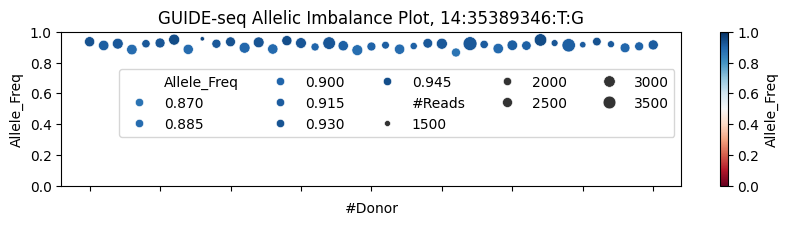

In [133]:
size_list = rhamp_dsODN_df.at[0,"total_list"]
VAF_list = rhamp_dsODN_df.at[0,"VAF_HET_donors"]
var = rhamp_dsODN_df.at[0,"ID2"]
plot_df = pd.DataFrame()
plot_df['#Reads'] = size_list
plot_df['Allele_Freq'] = VAF_list
plot_df['x'] = list(range(len(size_list)))
plt.figure(figsize=(10, 2))

# Create the dot plot
g=sns.scatterplot(
    data=plot_df,
    x='x', 
    y='Allele_Freq',
    size='#Reads', 
    hue='Allele_Freq',
    palette='RdBu',
    sizes=(10,100),
    hue_norm=(0,1),
    legend='brief'
)
plt.ylim(0,1)
# Customize the plot
plt.title(f'GUIDE-seq Allelic Imbalance Plot, {var}')
plt.xlabel('#Donor')
g.set(xticklabels=[])
plt.legend(loc='upper right', bbox_to_anchor=(1,0.8),ncol=5)
# g.legend(range(0,10000))
# Create a custom colorbar
# Create the dot plot
norm = plt.Normalize(0, 1)
sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=g)
cbar.set_label('Allele_Freq')
plt.savefig("test.pdf",bbox_inches='tight')
# Customize size legend
# import matplotlib.patches as mpatches


In [132]:
df = pd.read_csv("G1000_donor95_GUIDE_seq_overlap.Variant_info.PLINK_stats.update_Allelic_Imbalance_summary.High_confidence.csv")
df

,#CHROM,POS,ID,REF,ALT,Variant_mutation_type,MAF_EUR_unrel,MAF_EAS_unrel,MAF_AMR_unrel,MAF_SAS_unrel,...,rhamp_dsODN_AI_binom_P,rhamp_dsODN_AI_binom_FDR,E1,E2,E3,GA_score,R_AI,G_AI,AI_score,is_High_Confidence
0,chr4,1310782,4:1310782:C:T,C,T,SNP,0.040756,0.000000,0.021614,0.009202,...,NaN,NaN,True,False,False,1,False,False,0,0
1,chr14,35389346,14:35389346:T:G,T,G,SNP,0.180915,0.058532,0.370317,0.210634,...,0.000000e+00,0.000000e+00,True,True,True,3,True,True,2,1
2,chr13,102628187,13:102628187:G:A,G,A,SNP,0.136183,0.134921,0.113833,0.139059,...,9.760000e-105,1.010000e-103,True,False,False,1,True,False,1,1
3,chr3,49421943,3:49421943:T:C,T,C,SNP,0.431412,0.088294,0.384726,0.258691,...,6.840000e-75,5.300000e-74,True,False,False,1,True,True,2,1
4,chr1,64133482,1:64133482:A:C,A,C,SNP,0.002982,0.000000,0.025937,0.000000,...,0.000000e+00,0.000000e+00,True,True,True,3,True,True,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
207,chr11,113638937,11:113638937:A:C,A,C,SNP,0.000000,0.001984,0.000000,0.000000,...,NaN,NaN,False,False,False,0,False,False,0,0
208,chr6,12464157,6:12464157:A:T,A,T,SNP,0.000000,0.000000,0.000000,0.000000,...,1.580000e-30,8.150000e-30,False,True,False,1,True,False,1,1
209,chr3,52402443,3:52402443:T:G,T,G,SNP,0.004970,0.000000,0.000000,0.016360,...,NaN,NaN,False,False,False,0,False,False,0,0
210,chr10,27608840,10:27608840:A:G,A,G,SNP,0.291252,0.121032,0.197406,0.203476,...,1.530000e-05,3.050000e-05,False,False,False,0,False,False,0,0


In [135]:
rhamp_dsODN_df.head(n=1)

,ID2,Total_REF,Total_ALT,Total,total_list,VAF_HET_donors,VAF,N_donor_with_reads,binom_P,binom_FDR
0,14:35389346:T:G,8673,93001,101674,"[2566, 2643, 2768, 2673, 2027, 2488, 2834, 257...","[0.9349688473520249, 0.9107750472589792, 0.922...",0.914698,41,0.0,0.0


In [136]:
guide_AI_df.head(n=2)

,ID2,Total_REF,Total_ALT,Total,total_list,VAF_HET_donors,VAF,N_donor_with_reads,binom_P,binom_FDR
0,10:133087303:T:G,13.0,2.0,15.0,"[3.0, 2.0, 2.0, 2.0, 2.0, 4.0]","[0.2, 0.25, 0.25, 0.25, 0.25, 0.5]",0.133333,6,7.385254e-03,1.177359e-02
1,10:27608840:A:G,78.0,0.0,78.0,"[70.0, 4.0, 2.0, 1.0, 1.0]","[0.013888888888888888, 0.16666666666666666, 0....",0.000000,5,6.617445e-24,1.866459e-23


In [148]:

def AI_plot(size_list,VAF_list,title,outfile):
    plot_df = pd.DataFrame()
    plot_df['#Reads'] = size_list
    plot_df['Allele_Freq'] = VAF_list
    plot_df['x'] = list(range(len(size_list)))
    plt.figure(figsize=(10, 2))
    # Create the dot plot
    g=sns.scatterplot(
        data=plot_df,
        x='x', 
        y='Allele_Freq',
        size='#Reads', 
        hue='Allele_Freq',
        palette='RdBu',
        sizes=(10,100),
        hue_norm=(0,1),
        legend='brief'
    )
    plt.ylim(-0.1,1.1)
    # Customize the plot
    plt.title(title)
    plt.xlabel('#Donor')
    g.set(xticklabels=[])
    plt.legend(loc='upper right', bbox_to_anchor=(1,0.8),ncol=5)
    norm = plt.Normalize(0, 1)
    sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, ax=g)
    cbar.set_label('Allele_Freq')
    plt.savefig(outfile,bbox_inches='tight')


In [144]:
df

,#CHROM,POS,ID,REF,ALT,Variant_mutation_type,MAF_EUR_unrel,MAF_EAS_unrel,MAF_AMR_unrel,MAF_SAS_unrel,...,rhamp_dsODN_AI_binom_P,rhamp_dsODN_AI_binom_FDR,E1,E2,E3,GA_score,R_AI,G_AI,AI_score,is_High_Confidence
0,chr4,1310782,4:1310782:C:T,C,T,SNP,0.040756,0.000000,0.021614,0.009202,...,NaN,NaN,True,False,False,1,False,False,0,0
1,chr14,35389346,14:35389346:T:G,T,G,SNP,0.180915,0.058532,0.370317,0.210634,...,0.000000e+00,0.000000e+00,True,True,True,3,True,True,2,1
2,chr13,102628187,13:102628187:G:A,G,A,SNP,0.136183,0.134921,0.113833,0.139059,...,9.760000e-105,1.010000e-103,True,False,False,1,True,False,1,1
3,chr3,49421943,3:49421943:T:C,T,C,SNP,0.431412,0.088294,0.384726,0.258691,...,6.840000e-75,5.300000e-74,True,False,False,1,True,True,2,1
4,chr1,64133482,1:64133482:A:C,A,C,SNP,0.002982,0.000000,0.025937,0.000000,...,0.000000e+00,0.000000e+00,True,True,True,3,True,True,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
207,chr11,113638937,11:113638937:A:C,A,C,SNP,0.000000,0.001984,0.000000,0.000000,...,NaN,NaN,False,False,False,0,False,False,0,0
208,chr6,12464157,6:12464157:A:T,A,T,SNP,0.000000,0.000000,0.000000,0.000000,...,1.580000e-30,8.150000e-30,False,True,False,1,True,False,1,1
209,chr3,52402443,3:52402443:T:G,T,G,SNP,0.004970,0.000000,0.000000,0.016360,...,NaN,NaN,False,False,False,0,False,False,0,0
210,chr10,27608840,10:27608840:A:G,A,G,SNP,0.291252,0.121032,0.197406,0.203476,...,1.530000e-05,3.050000e-05,False,False,False,0,False,False,0,0


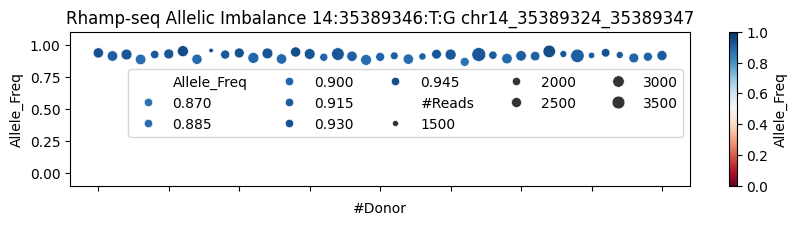

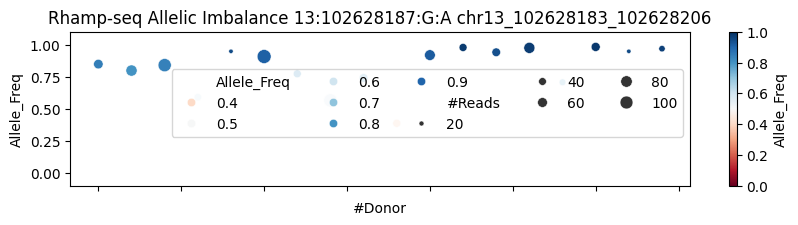

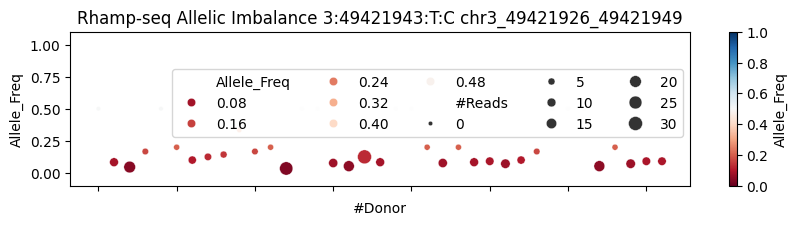

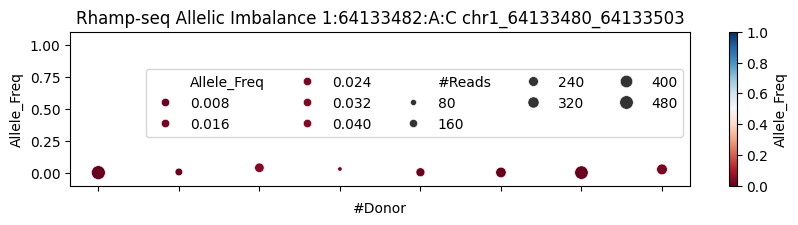

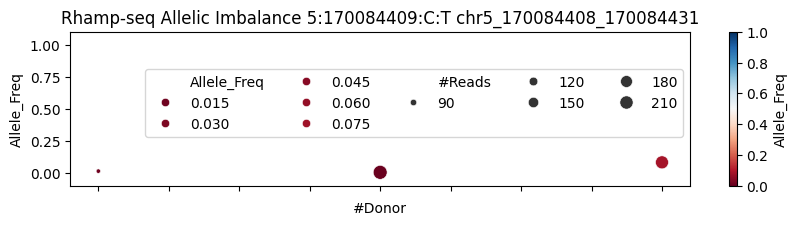

...

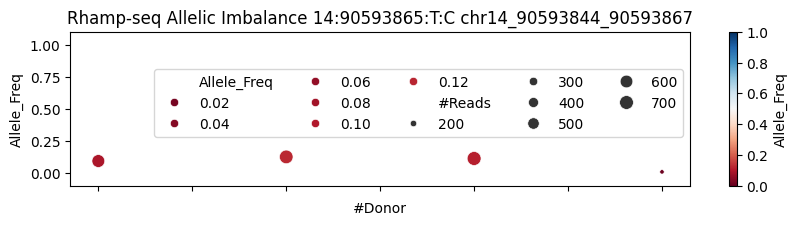

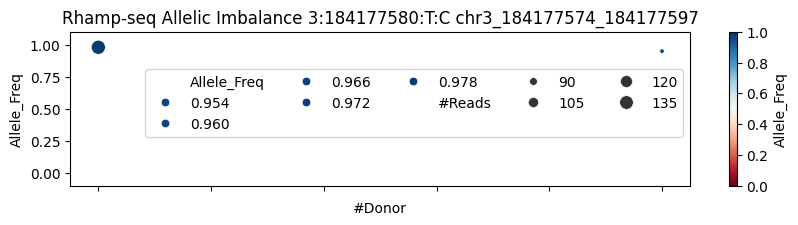

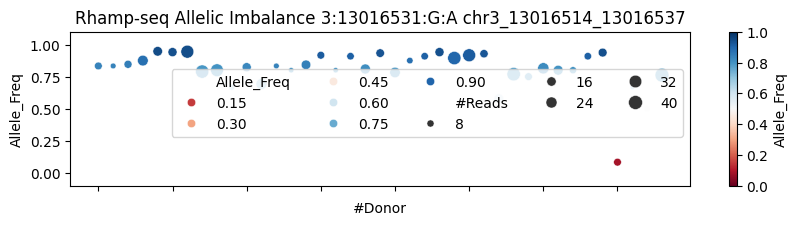

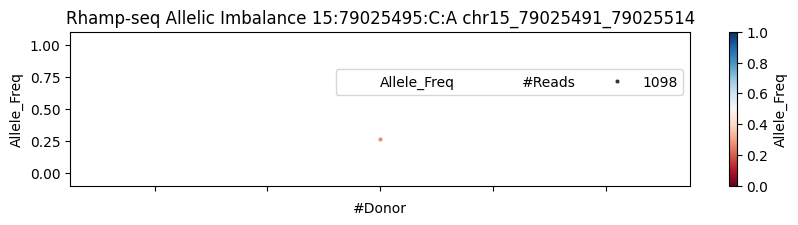

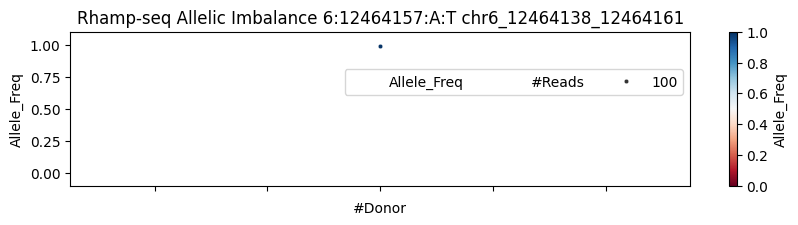

In [152]:
for i,r in df[df.is_High_Confidence==1].iterrows():
    ID2 = r.ID2
    OT_name = r.OT_name
    tmp = rhamp_dsODN_df[rhamp_dsODN_df.ID2==ID2]
    if r.R_AI==False:
        continue
    if tmp.shape[0]==0:
        print (OT_name,ID2,r.R_AI,r.G_AI)
        continue
    size_list = tmp.total_list.tolist()[0]
    VAF_list = tmp.VAF_HET_donors.tolist()[0]
    title = f'Rhamp-seq Allelic Imbalance {ID2} {OT_name}'
    outfile    = f"Rhamp_seq_AI_plot_{ID2}_{OT_name}.pdf"
    # print (size_list)
    AI_plot(size_list,VAF_list,title,outfile)

In [155]:
guide_AI_df[guide_AI_df.ID2.str.contains("3:130")]

,ID2,Total_REF,Total_ALT,Total,total_list,VAF_HET_donors,VAF,N_donor_with_reads,binom_P,binom_FDR
78,3:13016531:G:A,1401.0,3610.0,5011.0,"[191.0, 12.0, 279.0, 78.0, 6.0, 29.0, 15.0, 14...","[0.05699481865284974, 0.21428571428571427, 0.2...",0.720415,42,5.152419e-221,5.152419e-220


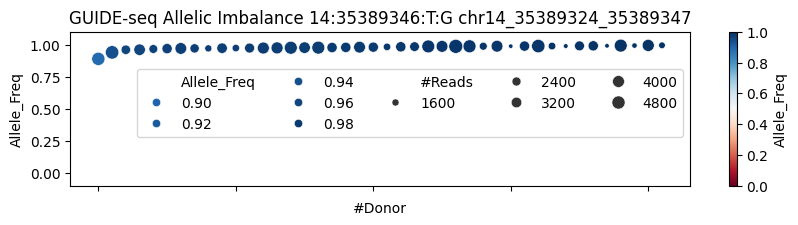

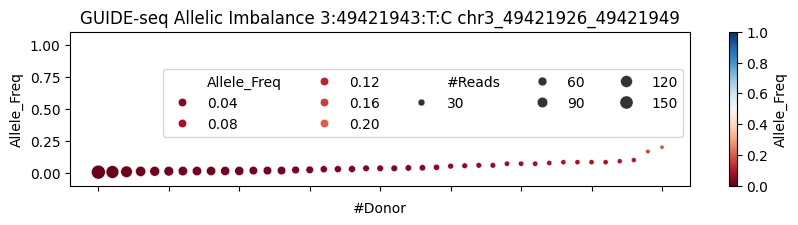

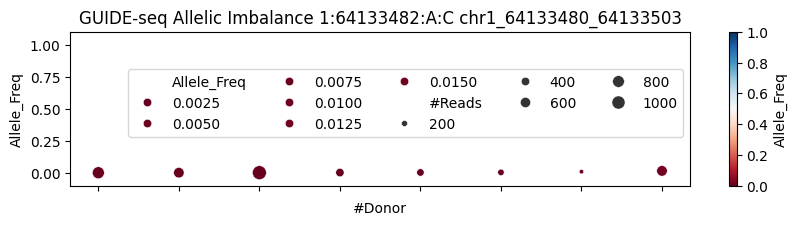

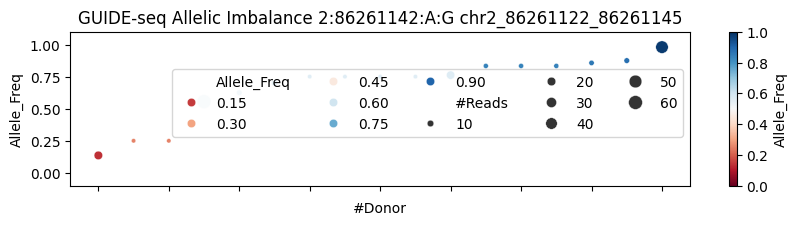

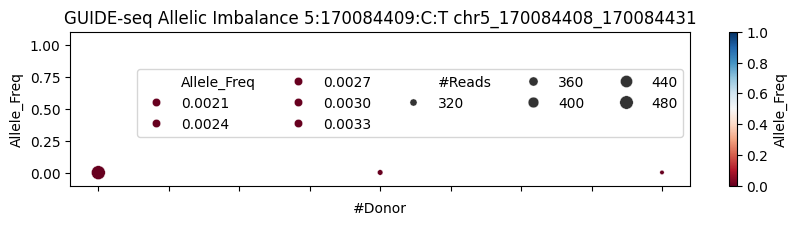

...

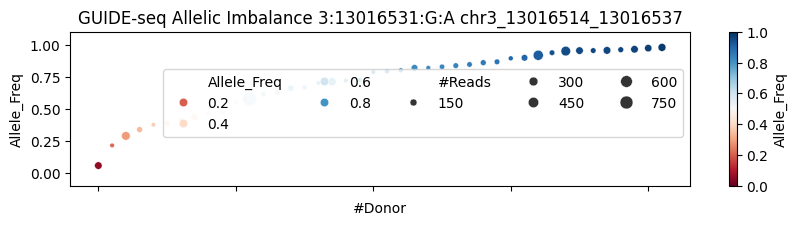

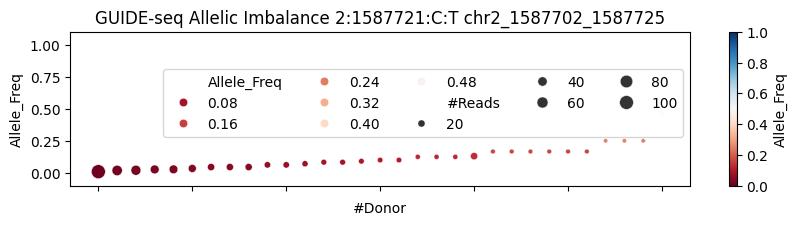

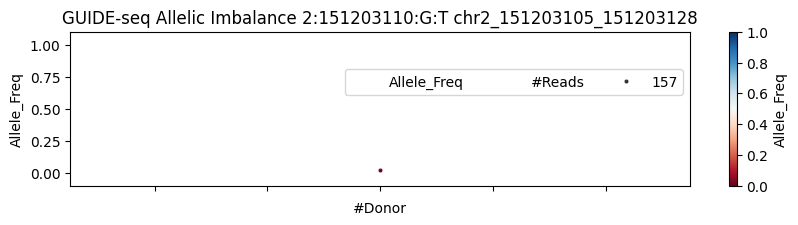

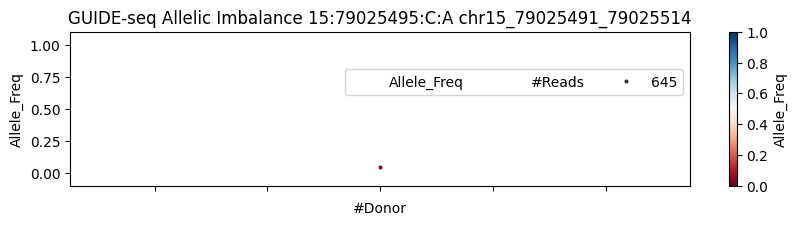

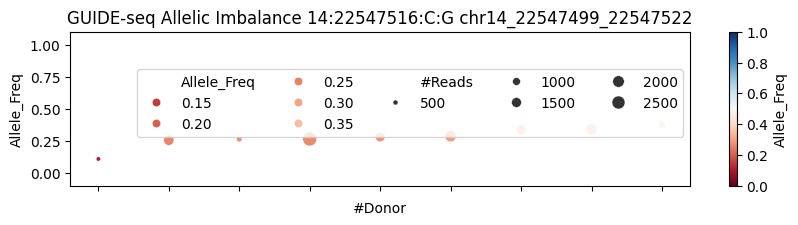

In [153]:
for i,r in df[df.is_High_Confidence==1].iterrows():
    ID2 = r.ID2
    OT_name = r.OT_name
    tmp = guide_AI_df[guide_AI_df.ID2==ID2]
    if r.G_AI==False:
        continue
    if tmp.shape[0]==0:
        print (OT_name,ID2,r.R_AI,r.G_AI)
        continue
    size_list = tmp.total_list.tolist()[0]
    VAF_list = tmp.VAF_HET_donors.tolist()[0]
    title = f'GUIDE-seq Allelic Imbalance {ID2} {OT_name}'
    outfile    = f"GUIDE_seq_AI_plot_{ID2}_{OT_name}.pdf"
    # print (size_list)
    AI_plot(size_list,VAF_list,title,outfile)

In [167]:
pd.set_option('display.max_rows', 100)

In [168]:
gdf5[gdf5.Variant_ID=="3:13016531:G:A"][['donor_x','GT']].sort_values('donor_x')

,donor_x,GT
2587,1.0,0
2657,2.0,1
2656,3.0,1
2632,4.0,0
2563,5.0,1
2630,6.0,1
2629,7.0,1
2628,8.0,0
2627,9.0,0
2626,10.0,0


In [158]:
guide_AI[guide_AI['Unnamed: 0'].str.contains("3:13016531:G:A")].sort_values("Total")

,Unnamed: 0,GUIDE_REF,GUIDE_ALT,GUIDE_ratio,GUIDE_donor,Variant_AF,Total
553,3:13016531:G:A,2.0,4.0,1.666667,95.0,0.625000,6.0
531,3:13016531:G:A,4.0,2.0,0.600000,5.0,0.375000,6.0
568,3:13016531:G:A,2.0,6.0,2.333333,3.0,0.700000,8.0
594,3:13016531:G:A,2.0,10.0,3.666667,23.0,0.785714,12.0
350,3:13016531:G:A,10.0,2.0,0.272727,33.0,0.214286,12.0
538,3:13016531:G:A,7.0,6.0,0.875000,36.0,0.466667,13.0
562,3:13016531:G:A,4.0,9.0,2.000000,79.0,0.666667,13.0
536,3:13016531:G:A,9.0,6.0,0.700000,69.0,0.411765,15.0
545,3:13016531:G:A,8.0,10.0,1.222222,39.0,0.550000,18.0
601,3:13016531:G:A,3.0,17.0,4.500000,81.0,0.818182,20.0
